In [25]:
import os
from Agent import Agent
from itertools import chain
from PIL import Image
import numpy as np
from plotResult import plotOptimalThresh, plotTest_IOU, plotLoss_IOU
from scipy.spatial import distance



import importlib
import plotResult
importlib.reload(plotResult)

import Agent
importlib.reload(Agent)


<module 'Agent' from '/Users/jiten/Masters/WorkPlace/MRI Fractures Project/MyCode/Agent.py'>

In [2]:
# initialize the parameters

my_path = "/Users/jiten/Masters/WorkPlace/"
folder_path = os.getcwd() #"/Users/jiten/Masters/WorkPlace/MRI Fractures Project/"

folder_path = os.path.dirname(folder_path)

print(folder_path)

#source_folder = os.path.join(folder_path, 'SAGT1_Images')
train_dir_SAGT1 = os.path.join(folder_path, "train_data_SAGT1")
test_dir_SAGT1 = os.path.join(folder_path, "test_data_SAGT1")
    
train_dir_dict = {}
test_dir_dict ={}
val_dir_dict ={}

#val_dir = os.path.join(folder_path, "validate")
train_dir_SAGT1 = os.path.join(folder_path, "train_data_SAGT1")
test_dir_SAGT1 = os.path.join(folder_path, "test_data_SAGT1")
val_dir_SAGT1 = os.path.join(folder_path, "val_data_SAGT1")

train_dir_SAGIR = os.path.join(folder_path, "train_data_SAGIR")
test_dir_SAGIR = os.path.join(folder_path, "test_data_SAGIR")
val_dir_SAGIR = os.path.join(folder_path, "val_data_SAGIR")

train_dir_dict['SAGT1'] = train_dir_SAGT1
train_dir_dict['SAGIR'] = train_dir_SAGIR

test_dir_dict['SAGT1'] = test_dir_SAGT1
test_dir_dict['SAGIR'] = test_dir_SAGIR

val_dir_dict['SAGT1'] = val_dir_SAGT1
val_dir_dict['SAGIR'] = val_dir_SAGIR

# create the data structure for mask directories
train_mask_dir_dict = {}
test_mask_dir_dict = {}
val_mask_dir_dict = {}

train_mask_dir_SAGT1 = os.path.join(folder_path, "train_mask_SAGT1")
test_mask_dir_SAGT1 = os.path.join(folder_path, "test_mask_SAGT1")
val_mask_dir_SAGT1 = os.path.join(folder_path, "val_mask_SAGT1")

train_mask_dir_SAGIR = os.path.join(folder_path, "train_mask_SAGIR")
test_mask_dir_SAGIR = os.path.join(folder_path, "test_mask_SAGIR")
val_mask_dir_SAGIR = os.path.join(folder_path, "val_mask_SAGIR")

train_mask_dir_dict['SAGT1'] = train_mask_dir_SAGT1
train_mask_dir_dict['SAGIR'] = train_mask_dir_SAGIR

test_mask_dir_dict['SAGT1'] = test_mask_dir_SAGT1
test_mask_dir_dict['SAGIR'] = test_mask_dir_SAGIR

val_mask_dir_dict['SAGT1'] = val_mask_dir_SAGT1
val_mask_dir_dict['SAGIR'] = val_mask_dir_SAGIR

/Users/jiten/Masters/WorkPlace/MRI Fractures Project


In [3]:
img = 'SAGIR'
train_flag = True
#train_flag = False

# train_dir = train_dir_dict[img]
# mask_dir = train_mask_dir_dict[img]

# val_dir = val_dir_dict[img]
# mask_dir_val = val_mask_dir_dict[img]

# test_dir = test_dir_dict[img]
# mask_dir_test = test_mask_dir_dict[img]

In [4]:
# initialize the directory and get the model
if train_flag:
    train_dir = train_dir_dict[img]
    mask_dir = train_mask_dir_dict[img]

    val_dir = val_dir_dict[img]
    mask_dir_val = val_mask_dir_dict[img]

    # initialize agent
    agent = Agent.Agent(train_flag,img_dir=train_dir,msk_dir=mask_dir,folder_path=folder_path, val_dir=val_dir, msk_dir_val=mask_dir_val, 
                  state='new', num_epochs=200, batchSize=30, bilinear=False)
    agent.initializeUnet()

     # load custom dataset
    train_loader, val_loader = agent.loadCustomData()
        

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: True
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/train_data_SAGIR
Total Size ::: 559
Initialize Custom Data
Total Size val::: 116


In [8]:
# run the model and get the predictions
if train_flag:
    # run the model
    loss_df, prediction_batch, iou_sore_df, loss_val_df, iou_score_val_df, prediction_batch_val = agent.runModel(train_loader, val_loader)

Epoch [1/200], Train( Loss: 0.3036, IoU_score: 0.0536 ) ::: Validation ( Loss: 0.2939, IoU_score: 0.0454 )
Epoch [2/200], Train( Loss: 0.2693, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.2339, IoU_score: 0.0454 )
Epoch [3/200], Train( Loss: 0.2524, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.2508, IoU_score: 0.0454 )
Epoch [4/200], Train( Loss: 0.2318, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.2123, IoU_score: 0.0454 )
Epoch [5/200], Train( Loss: 0.2098, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.1948, IoU_score: 0.0454 )
Epoch [6/200], Train( Loss: 0.1875, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.1737, IoU_score: 0.0454 )
Epoch [7/200], Train( Loss: 0.1665, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.1601, IoU_score: 0.0454 )
Epoch [8/200], Train( Loss: 0.1475, IoU_score: 0.0537 ) ::: Validation ( Loss: 0.1462, IoU_score: 0.0454 )
Epoch [9/200], Train( Loss: 0.1292, IoU_score: 0.0543 ) ::: Validation ( Loss: 0.1300, IoU_score: 0.0455 )
Epoch [10/200], Train( Loss: 0.1129, 

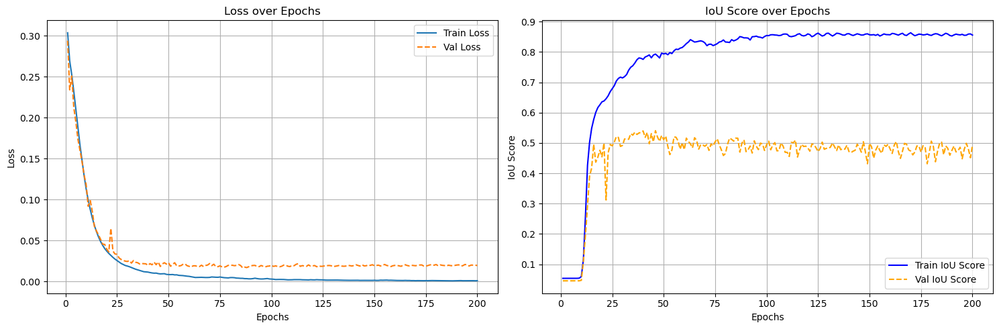

In [9]:
# plot the training and validaiton data
plotResult.plotLoss_IOU(loss_df, iou_sore_df, loss_val_df, iou_score_val_df)

In [10]:
 # join the list of prediction lists 
predictions = list(chain(*prediction_batch))
predictions_val = list(chain(*prediction_batch_val))

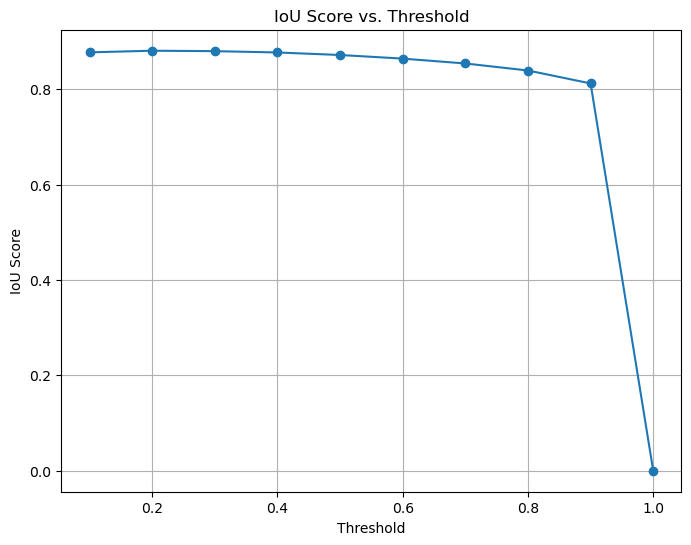

In [11]:
# check for optimal threshold for deciding the threshold for training
if train_flag:
    # compute an optimal threshold
    iou_vs_thresh = agent.optimalThresVsIoU(train_loader, predictions)
    plotOptimalThresh(iou_vs_thresh)

P088 SAGIR_020.jpg


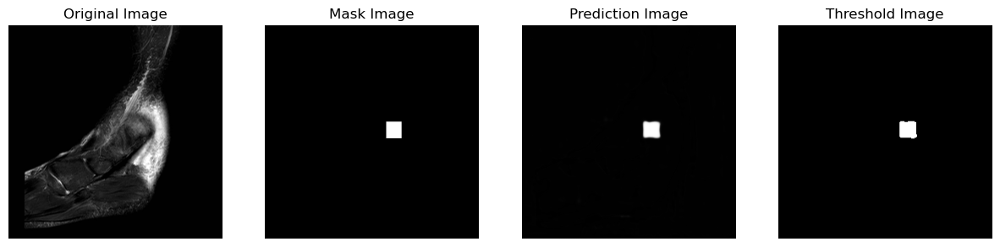

P089 SAGIR_012.jpg


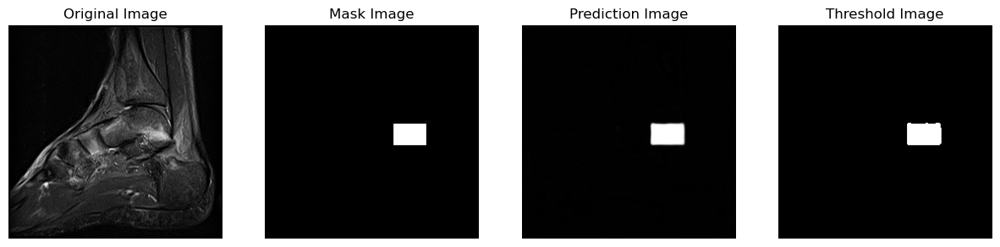

P047 SAGIR_014.jpg


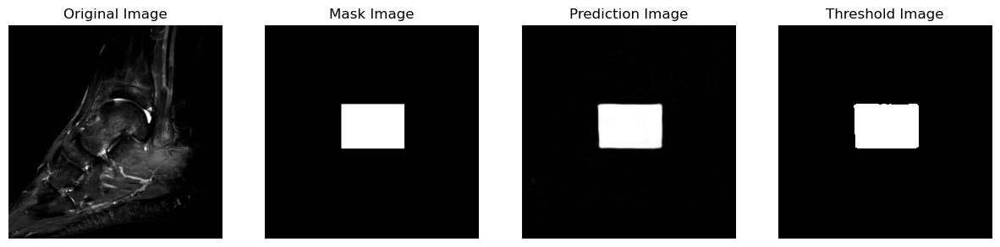

P009 SAGIR_013.jpg


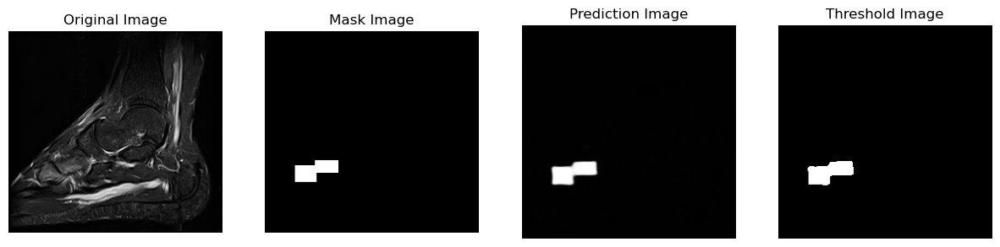

P034 SAGIR_012.jpg


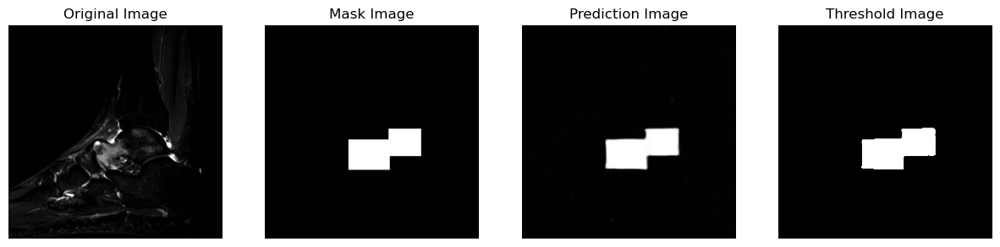

P023 SAGIR_012.jpg


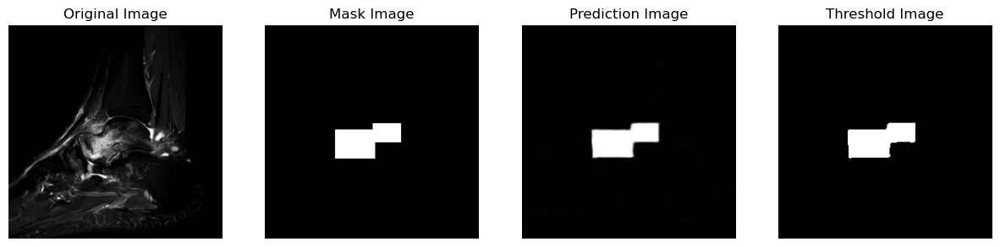

P079 SAGIR_004.jpg


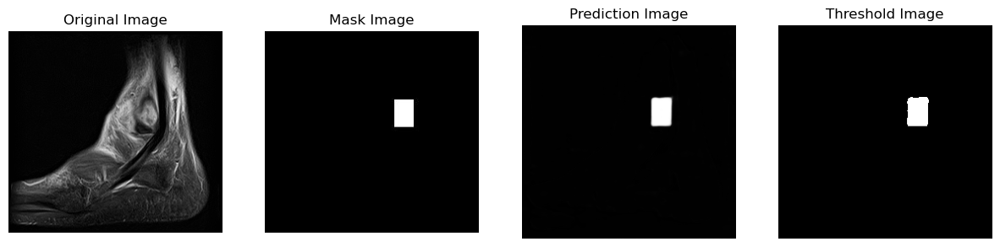

P050 SAGIR_014.jpg


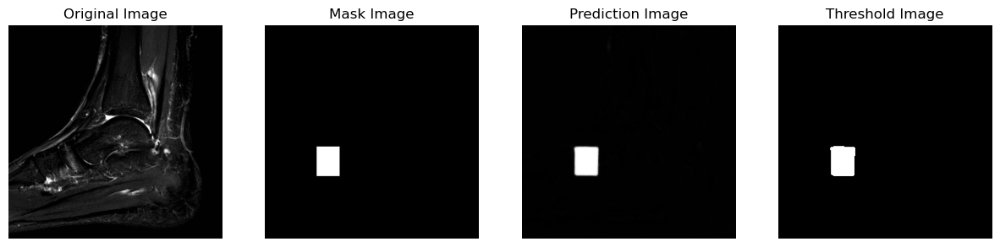

P036 SAGIR_018.jpg


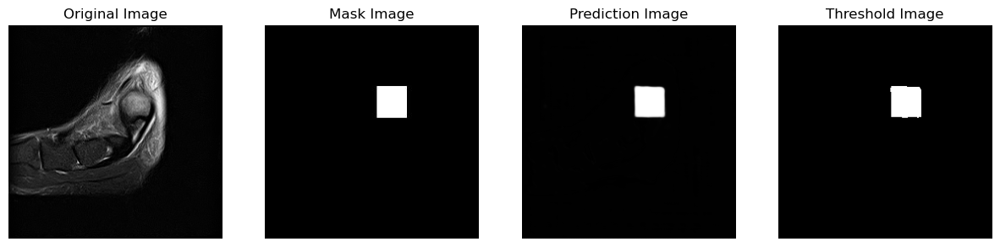

P050 SAGIR_015.jpg


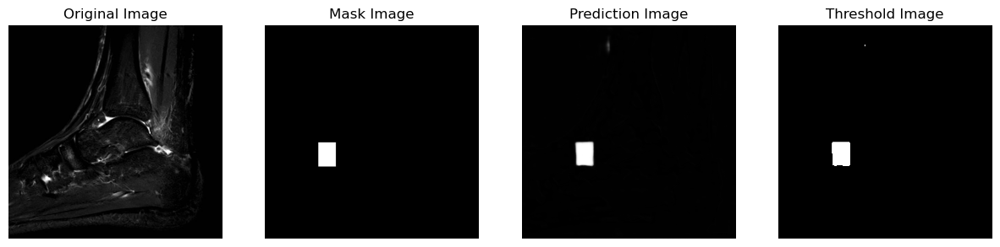

In [12]:
# writ the data
if train_flag:
    # plot few results
    agent.printPrediction(loader=train_loader, preds=predictions)


P055 SAGIR_009.jpg


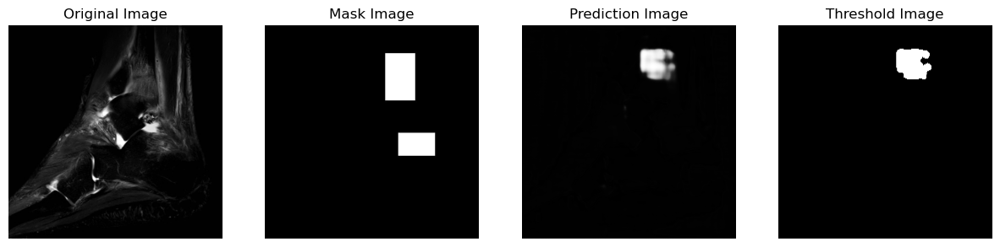

P051 SAGIR_008.jpg


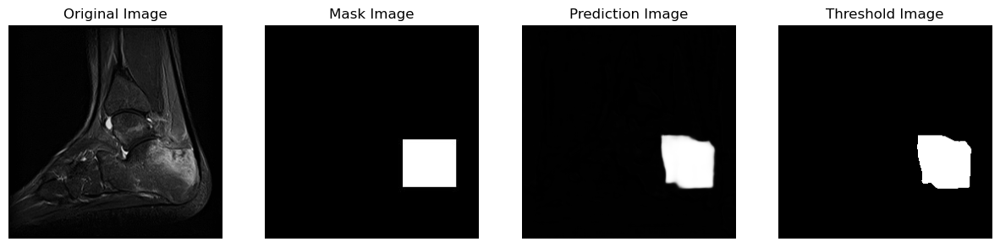

P051 SAGIR_009.jpg


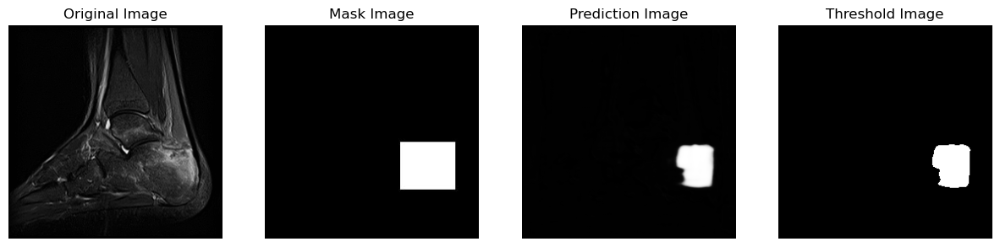

P055 SAGIR_008.jpg


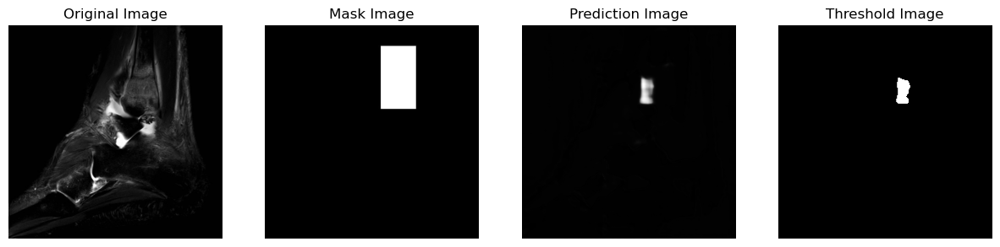

P031 SAGIR_018.jpg


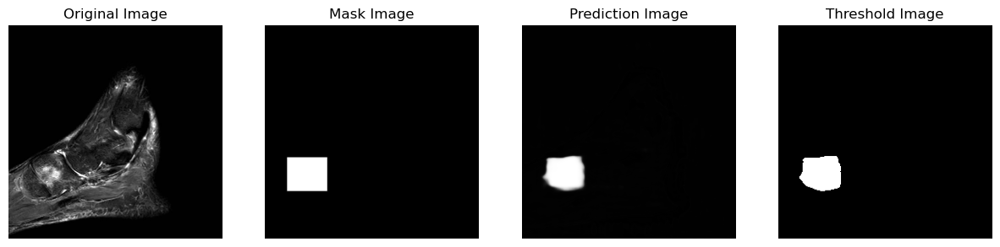

P031 SAGIR_019.jpg


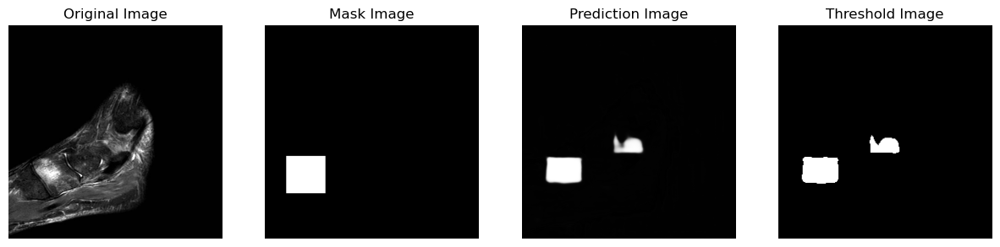

P096 SAGIR_009.jpg


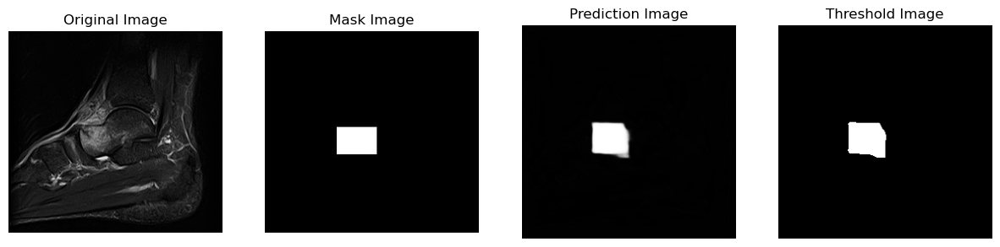

P003 SAGIR_017.jpg


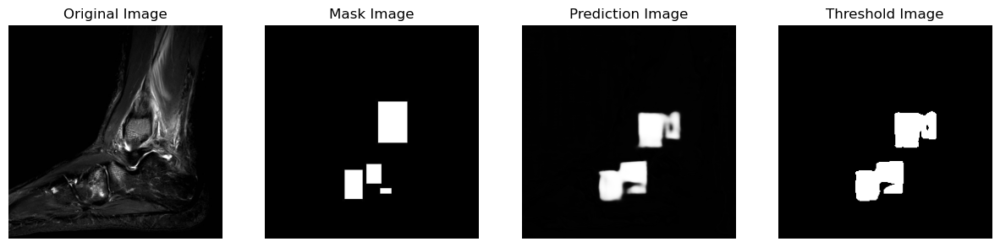

P094 SAGIR_016.jpg


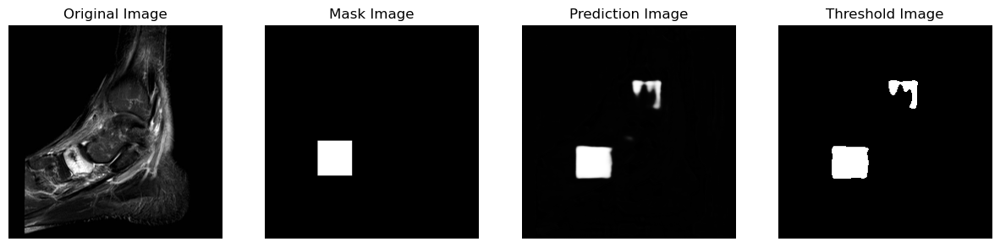

P093 SAGIR_006.jpg


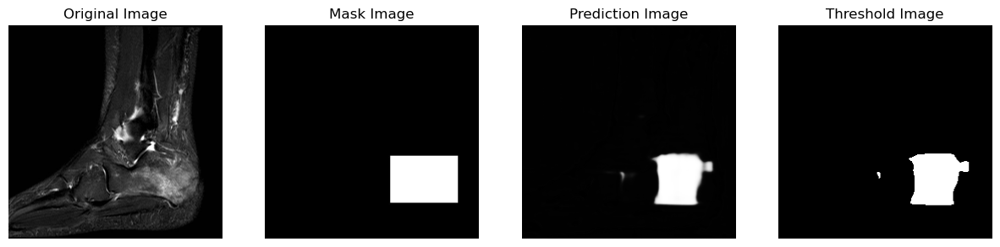

In [13]:
# Print few validation results
# plot few results
agent.printPrediction(loader=val_loader, preds=predictions_val, idx=10, validation=True)

In [14]:
# write the data to the files and save the net
w_path = os.path.join(folder_path,"Result","IoUScore.csv")
agent.writeRun(iou_sore_df,w_path)

# write the loss data
w_path = os.path.join(folder_path,"Result","LossOutput.csv")
agent.writeRun(loss_df,w_path)

# save the net
agent.save_net(file_name='UNet1')

In [15]:
train_flag = False

# set the directories
test_dir = test_dir_dict[img]
mask_dir_test = test_mask_dir_dict[img]

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=185, bilinear=False)
agent_test.initializeUnet('UNet1Jul 01, 2024 12_45PM')

test_loader = agent_test.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


0.4307142596809704
Iou Score ::::0.4307142596809704
185


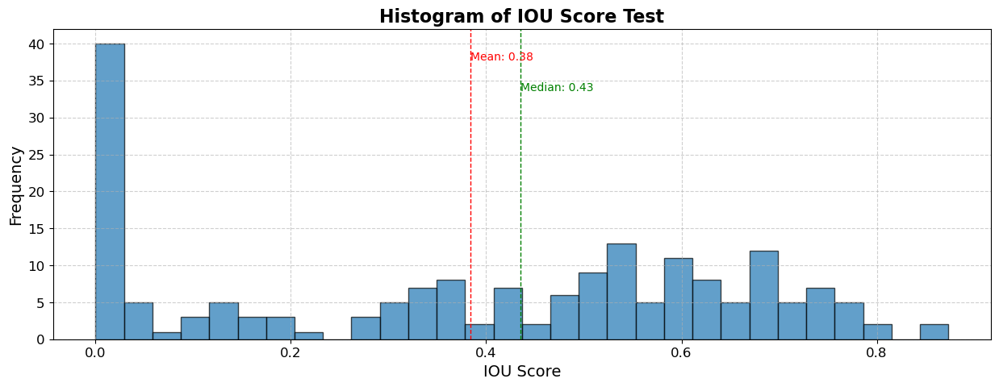

In [16]:
# run the model for test and check the iou and histogram
prediction_batch_test, iou_score_batch_test, iou_score_each_test = agent_test.runModel(test_loader)
print(len(iou_score_each_test))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test)

### Train experiment with Data Augmentation

In [17]:
train_flag = True
# initialize agent
agent_aug = Agent.Agent(train_flag,img_dir=train_dir,msk_dir=mask_dir,folder_path=folder_path, val_dir=val_dir, msk_dir_val=mask_dir_val, 
                state='new', num_epochs=200, batchSize=30, bilinear=False)
agent_aug.initializeUnet()

# load custom dataset
train_loader, val_loader = agent_aug.loadCustomData(augment=True)

mps
Initialize Custom Data
Augmentation Initialized
Augmentation ::: True
Train flag:: True
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/train_data_SAGIR
Total Size ::: 1118
Initialize Custom Data
Total Size val::: 116


In [18]:
# rum the model fwith the augmented data
loss_aug_df, prediction_aug_batch, iou_sore_aug_df, loss_aug_val_df, iou_score_aug_val_df, prediction__aug_batch_val = agent_aug.runModel(train_loader, val_loader)

Epoch [1/200], Train( Loss: 0.2822, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.2509, IoU_score: 0.0454 )
Epoch [2/200], Train( Loss: 0.2269, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.2094, IoU_score: 0.0454 )
Epoch [3/200], Train( Loss: 0.2012, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.1935, IoU_score: 0.0454 )
Epoch [4/200], Train( Loss: 0.1782, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.1742, IoU_score: 0.0454 )
Epoch [5/200], Train( Loss: 0.1559, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.1477, IoU_score: 0.0454 )
Epoch [6/200], Train( Loss: 0.1349, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.1222, IoU_score: 0.0456 )
Epoch [7/200], Train( Loss: 0.1166, IoU_score: 0.0628 ) ::: Validation ( Loss: 0.1024, IoU_score: 0.0908 )
Epoch [8/200], Train( Loss: 0.1005, IoU_score: 0.1150 ) ::: Validation ( Loss: 0.0906, IoU_score: 0.1624 )
Epoch [9/200], Train( Loss: 0.0864, IoU_score: 0.2407 ) ::: Validation ( Loss: 0.0794, IoU_score: 0.3845 )
Epoch [10/200], Train( Loss: 0.0751, 

In [19]:
 # join the list of prediction lists 
predictions_aug = list(chain(*prediction_aug_batch))
predictions_aug_val = list(chain(*prediction__aug_batch_val))

P096 SAGIR_009.jpg


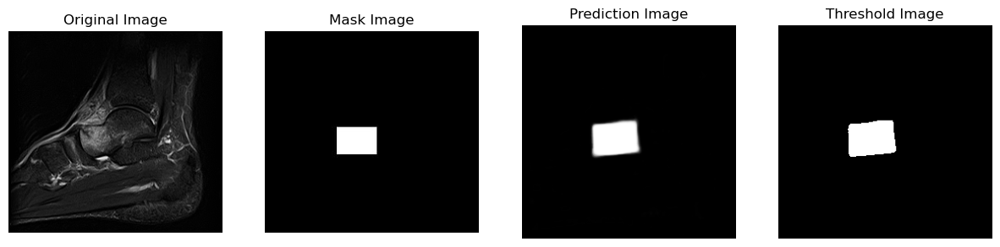

P003 SAGIR_017.jpg


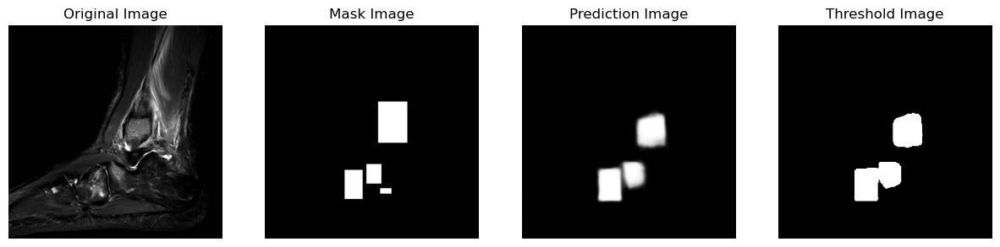

P094 SAGIR_016.jpg


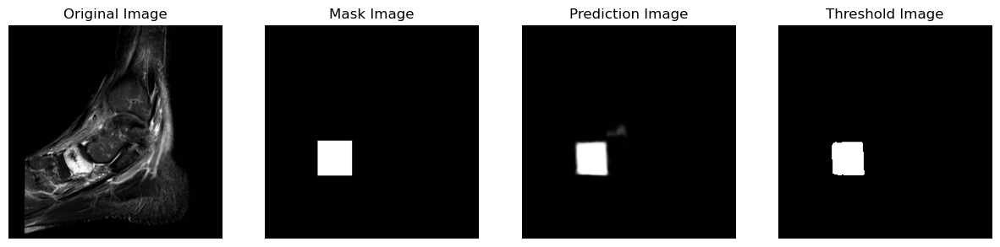

P093 SAGIR_006.jpg


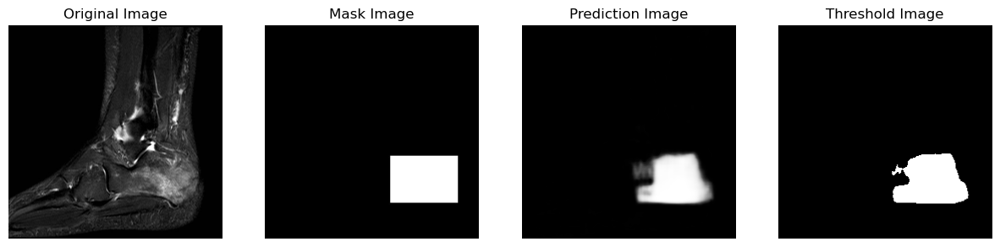

P074 SAGIR_010.jpg


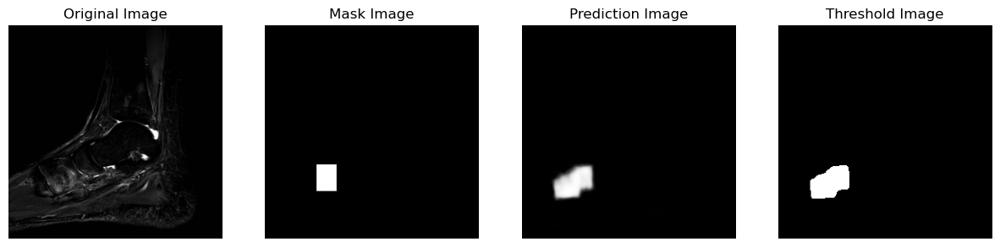

P093 SAGIR_012.jpg


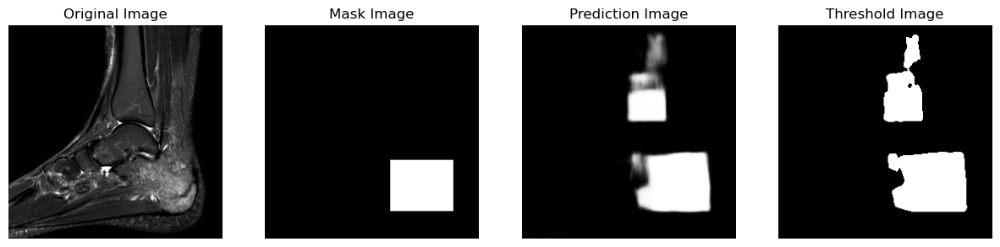

P007 SAGIR_016.jpg


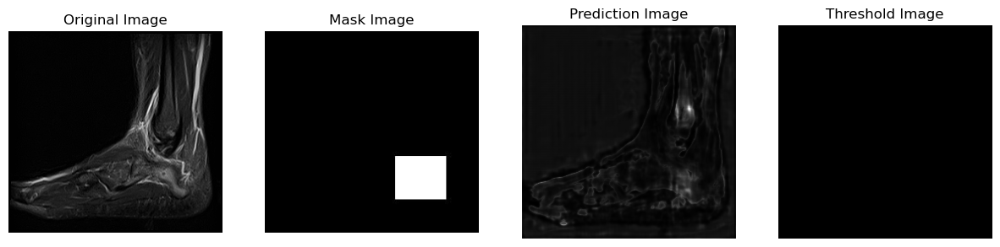

P004 SAGIR_013.jpg


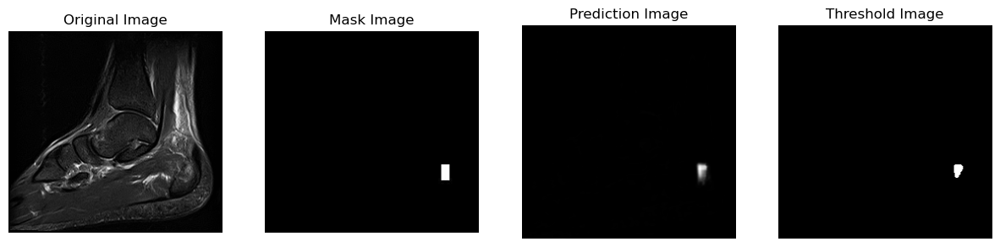

P004 SAGIR_012.jpg


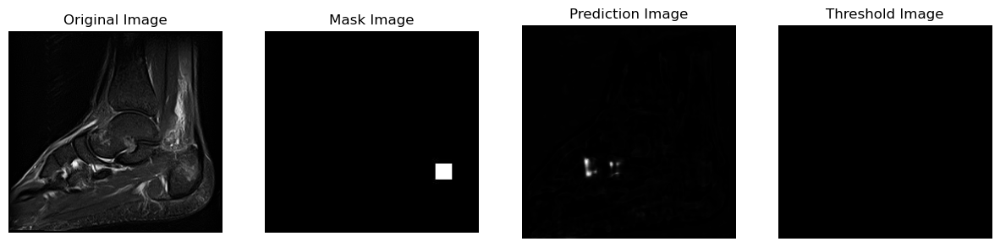

P093 SAGIR_013.jpg


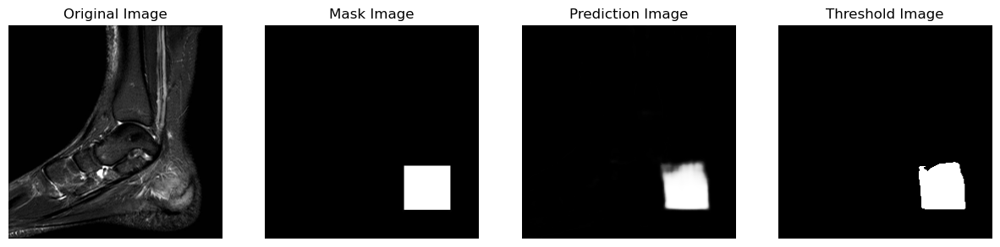

In [20]:
 # plot few results
agent_aug.printPrediction(loader=val_loader, idx=16, preds=predictions_aug_val, validation=True)

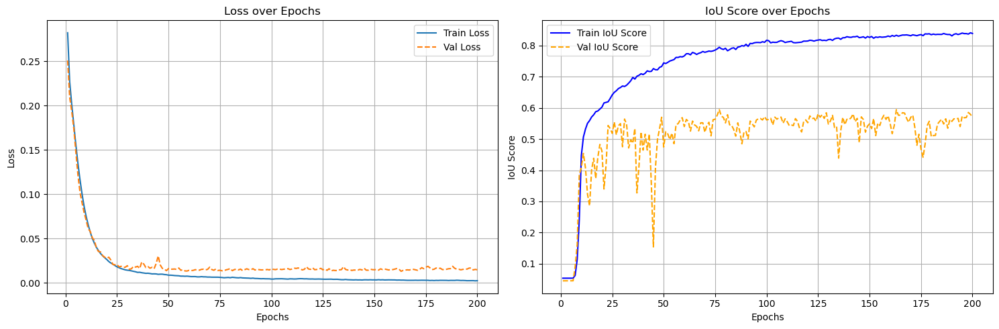

In [21]:
# plot the training and validaiton data
plotResult.plotLoss_IOU(loss_aug_df, iou_sore_aug_df, loss_aug_val_df, iou_score_aug_val_df)

In [22]:
# write the data to the files and save the net
w_path = os.path.join(folder_path,"Result","IoUScore_aug.csv")
agent_aug.writeRun(iou_sore_aug_df,w_path)

# write the loss data
w_path = os.path.join(folder_path,"Result","LossOutput_aug.csv")
agent_aug.writeRun(loss_aug_df,w_path)

# save the net
agent_aug.save_net(file_name='UNet_aug')

### Test the Model with the model trained with augmented data

In [25]:
train_flag = False

# set the directories
#test_dir = test_dir_dict[img]
#mask_dir_test = test_mask_dir_dict[img]

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=186, bilinear=False)
agent_test.initializeUnet('UNet_augJul 01, 2024 01_34PM')

test_loader_aug = agent_test.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


0.4865433171012404
Iou Score ::::0.4865433171012404
185


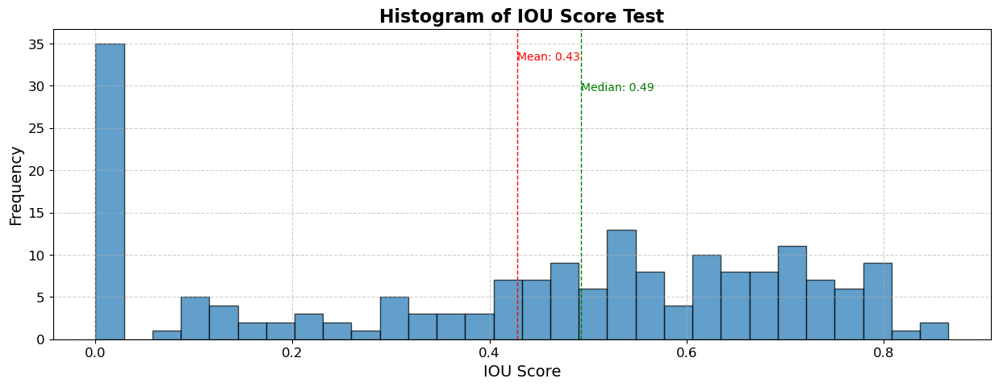

In [26]:

prediction_batch_test, iou_score_batch_test, iou_score_each_test = agent_test.runModel(test_loader_aug)
print(len(iou_score_each_test))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test)

In [27]:
# join the predictions of the test
predictions_test = list(chain(*prediction_batch_test))

P053 SAGIR_010.jpg


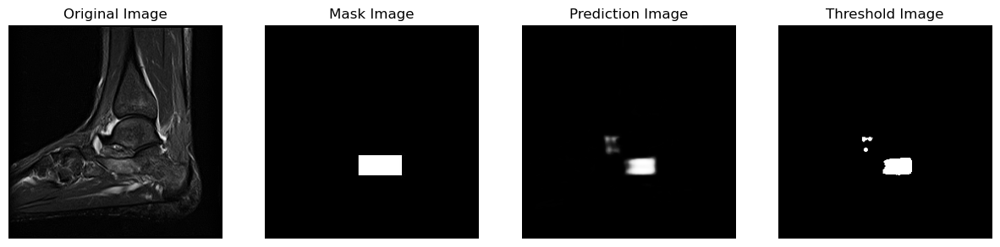

P020 SAGIR_016.jpg


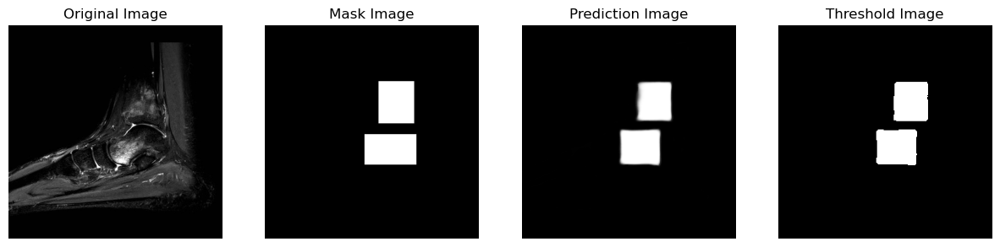

P035 SAGIR_009.jpg


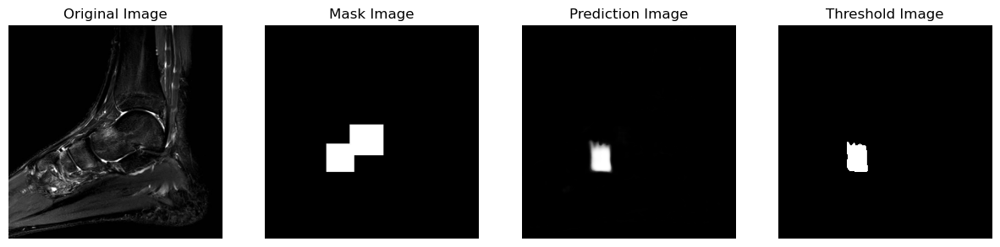

P027 SAGIR_012.jpg


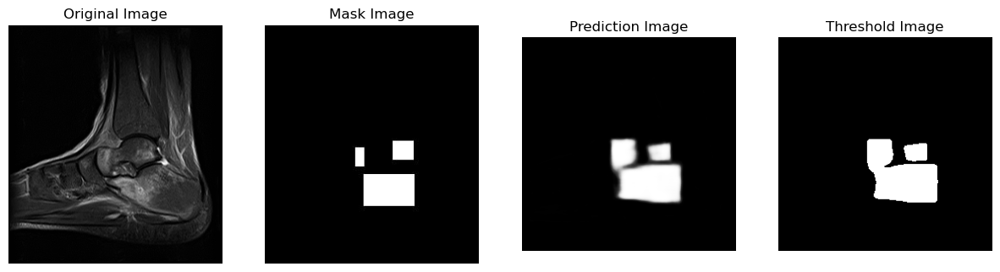

P057 SAGIR_011.jpg


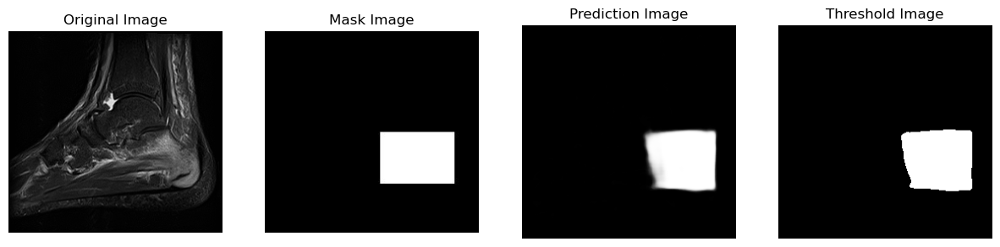

P024 SAGIR_017.jpg


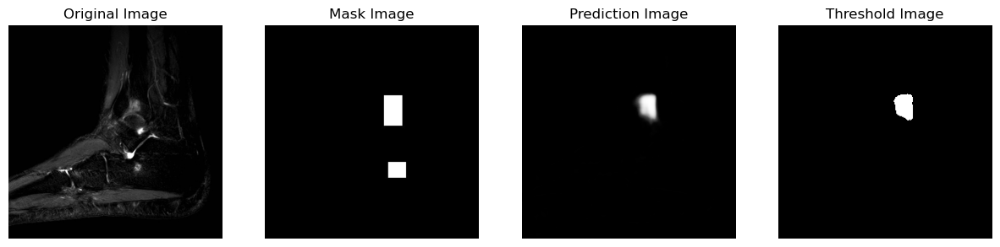

P056 SAGIR_009.jpg


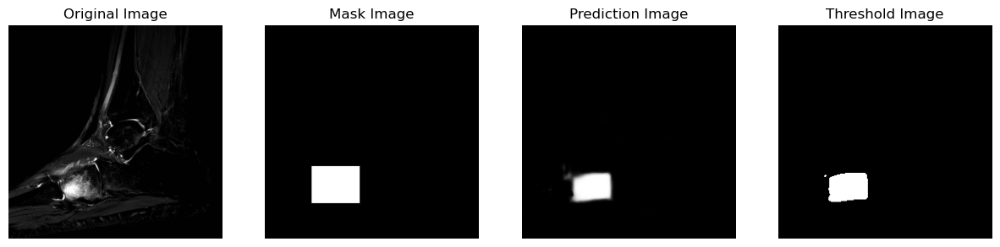

P024 SAGIR_015.jpg


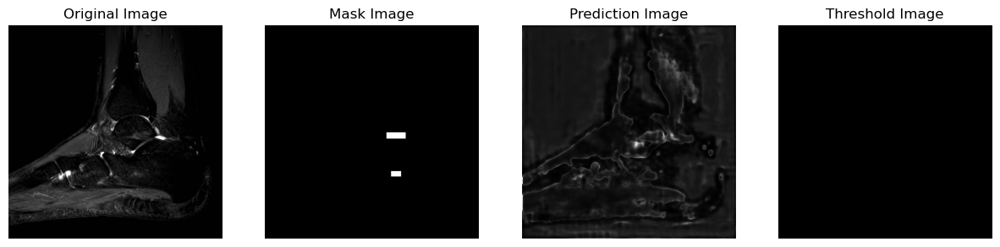

P057 SAGIR_013.jpg


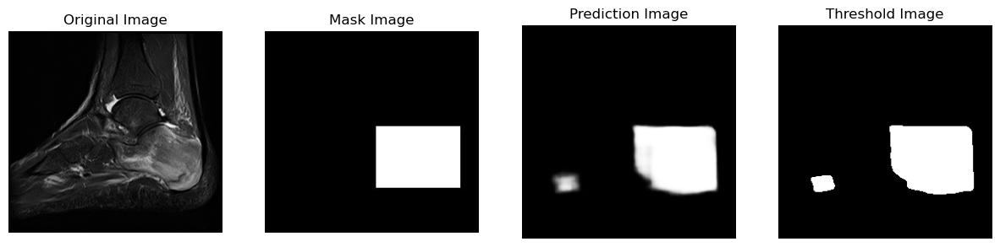

P027 SAGIR_010.jpg


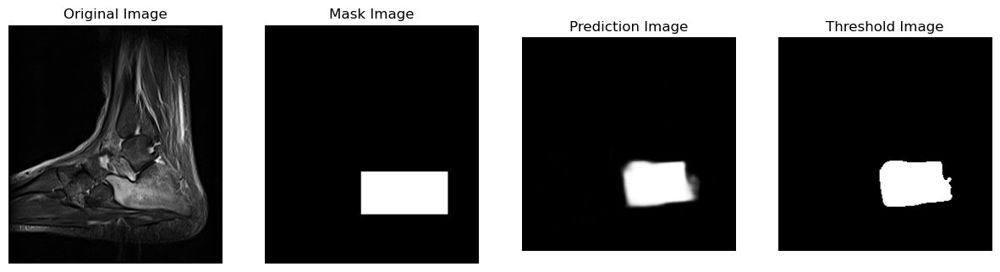

In [37]:

# plot few results
agent_test.printPrediction(loader=test_loader_aug, idx=10, preds=predictions_test)

#agent.savePredictions(loader=test_loader, predictions=predictions)

### Train with L2 Regularization (Weighted Decay) with early stopping

In [38]:
train_flag = True

 # initialize agent
agent_l2 = Agent.Agent(train_flag,img_dir=train_dir,msk_dir=mask_dir,folder_path=folder_path, val_dir=val_dir, msk_dir_val=mask_dir_val, 
                  state='new', num_epochs=200, batchSize=30, bilinear=False)
agent_l2.initializeUnet()

# load custom dataset
train_loader_l2, val_loader_l2 = agent_l2.loadCustomData(augment=True)

mps
Initialize Custom Data
Augmentation Initialized
Augmentation ::: True
Train flag:: True
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/train_data_SAGIR
Total Size ::: 1118
Initialize Custom Data
Total Size val::: 116


In [39]:
# run the model
loss_df_l2, prediction_batch_l2, iou_sore_df_l2, loss_val_df_l2, iou_score_val_df_l2, prediction_batch_val_l2 = agent_l2.runModel(train_loader_l2, 
                                                                                                                                  val_loader_l2,
                                                                                                                                  earlyStop=True, 
                                                                                                                                  L2Reg=True)

Epoch [1/200], Train( Loss: 0.1099, IoU_score: 0.1098 ) ::: Validation ( Loss: 0.1042, IoU_score: 0.0361 )
Epoch [2/200], Train( Loss: 0.0768, IoU_score: 0.2547 ) ::: Validation ( Loss: 0.0597, IoU_score: 0.2745 )
Epoch [3/200], Train( Loss: 0.0582, IoU_score: 0.3932 ) ::: Validation ( Loss: 0.0915, IoU_score: 0.1176 )
EarlyStopping counter: 1 out of 5
Epoch [4/200], Train( Loss: 0.0472, IoU_score: 0.4408 ) ::: Validation ( Loss: 0.0499, IoU_score: 0.2307 )
Epoch [5/200], Train( Loss: 0.0397, IoU_score: 0.4835 ) ::: Validation ( Loss: 0.0378, IoU_score: 0.3599 )
Epoch [6/200], Train( Loss: 0.0349, IoU_score: 0.5095 ) ::: Validation ( Loss: 0.0318, IoU_score: 0.3661 )
Epoch [7/200], Train( Loss: 0.0319, IoU_score: 0.5237 ) ::: Validation ( Loss: 0.0328, IoU_score: 0.2087 )
EarlyStopping counter: 1 out of 5
Epoch [8/200], Train( Loss: 0.0298, IoU_score: 0.5352 ) ::: Validation ( Loss: 0.0319, IoU_score: 0.1859 )
EarlyStopping counter: 2 out of 5
Epoch [9/200], Train( Loss: 0.0282, IoU_sc

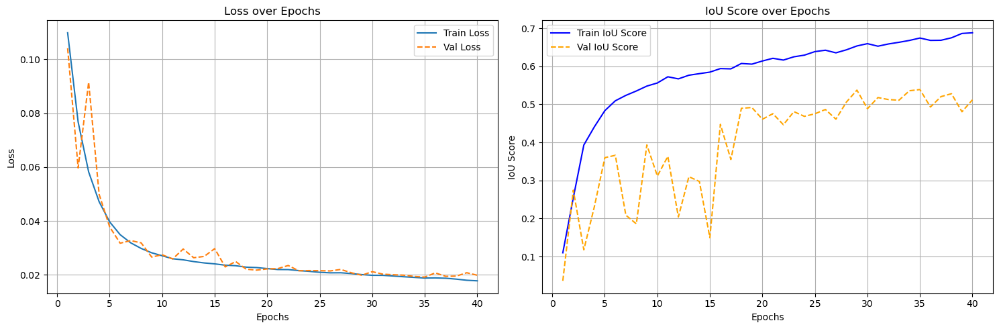

In [40]:
# plot the training and validaiton data
plotResult.plotLoss_IOU(loss_df_l2, iou_sore_df_l2, loss_val_df_l2, iou_score_val_df_l2)

In [41]:
# write the data to the files and save the net
w_path = os.path.join(folder_path,"Result","IoUScore_l2.csv")
agent_l2.writeRun(iou_sore_df_l2,w_path)

# write the loss data
w_path = os.path.join(folder_path,"Result","LossOutput_l2.csv")
agent_l2.writeRun(loss_df_l2,w_path)

# save the net
agent_l2.save_net(file_name='UNet_l2')

### Test this saved model

In [42]:
train_flag = False

# set the directories
#test_dir = test_dir_dict[img]
#mask_dir_test = test_mask_dir_dict[img]

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_l2 = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=186, bilinear=False)
agent_test_l2.initializeUnet('UNet_l2Jul 01, 2024 02_16PM')

test_loader_l2 = agent_test_l2.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


0.5359823727530113
Iou Score ::::0.5359823727530113
185


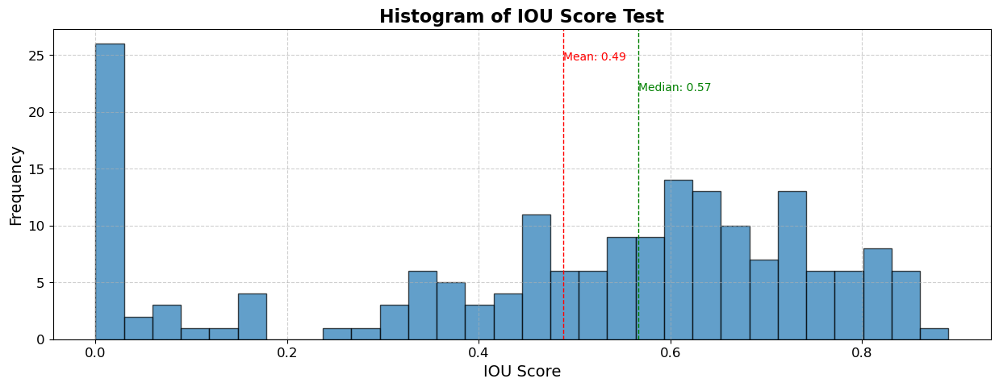

In [43]:
prediction_batch_test_l2, iou_score_batch_test_l2, iou_score_each_test_l2 = agent_test_l2.runModel(test_loader_l2)
print(len(iou_score_each_test_l2))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test_l2)

In [44]:
# join the predictions of the test
predictions_test_l2 = list(chain(*prediction_batch_test_l2))

P020 SAGIR_016.jpg


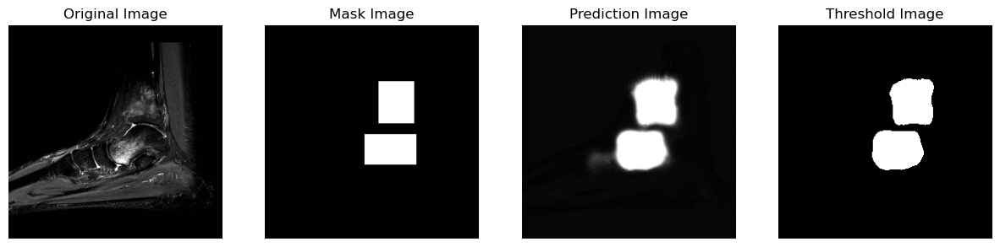

P035 SAGIR_009.jpg


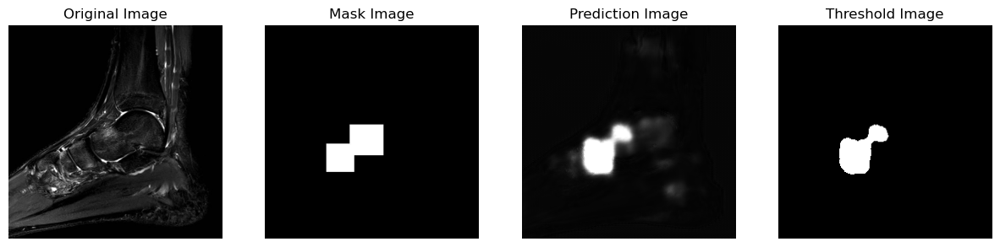

P027 SAGIR_012.jpg


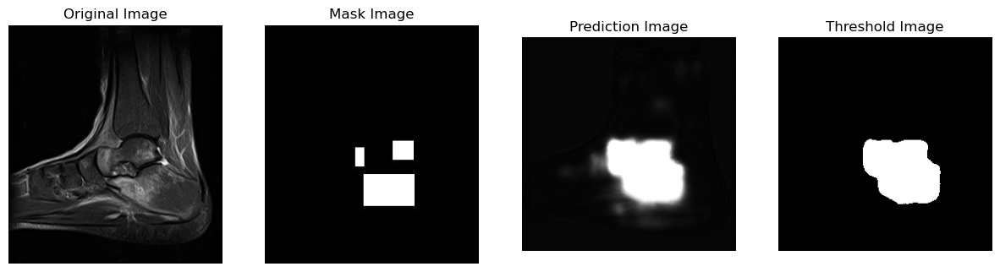

P057 SAGIR_011.jpg


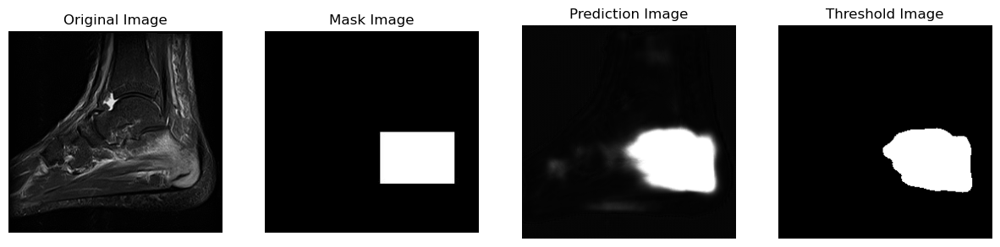

P024 SAGIR_017.jpg


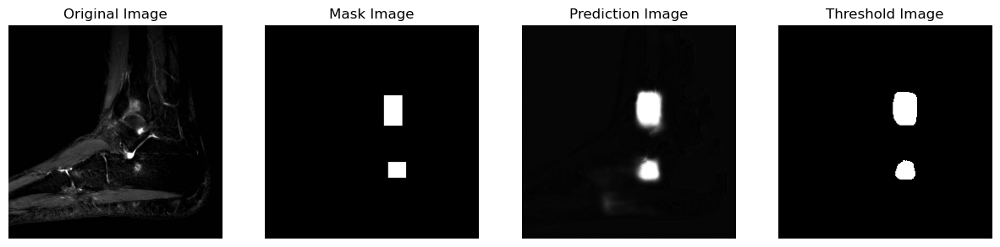

P056 SAGIR_009.jpg


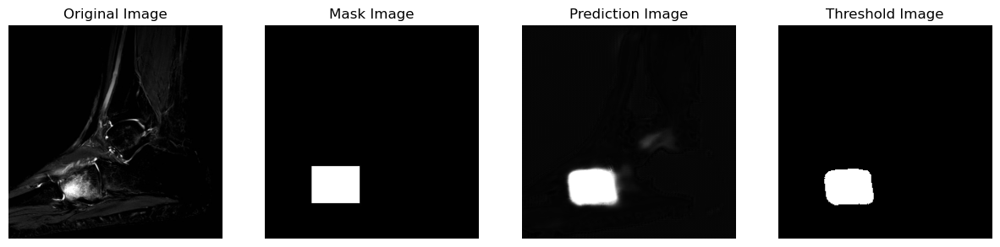

P024 SAGIR_015.jpg


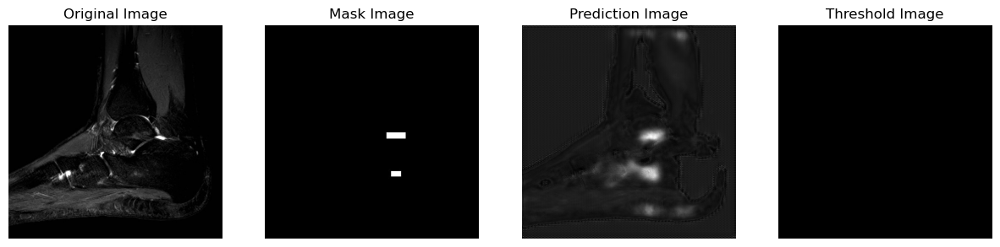

P057 SAGIR_013.jpg


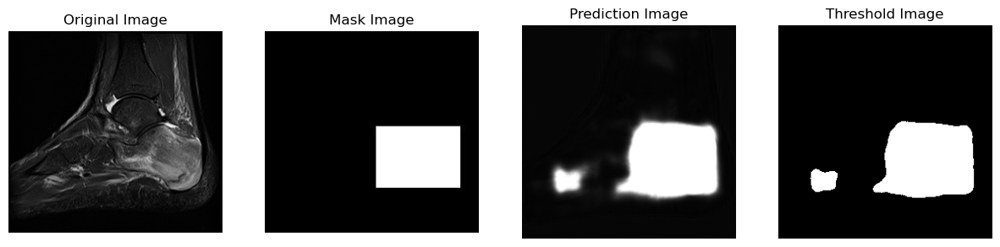

P027 SAGIR_010.jpg


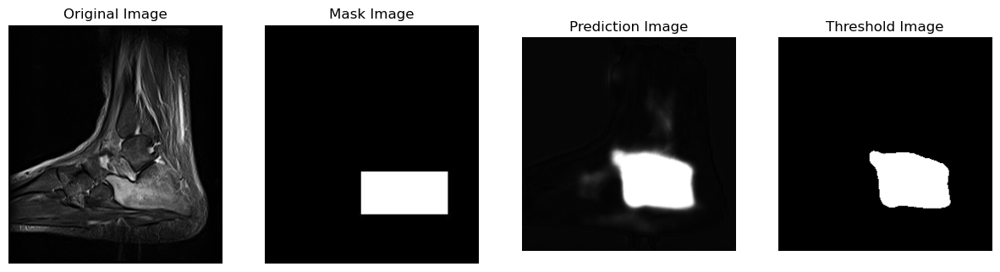

P020 SAGIR_014.jpg


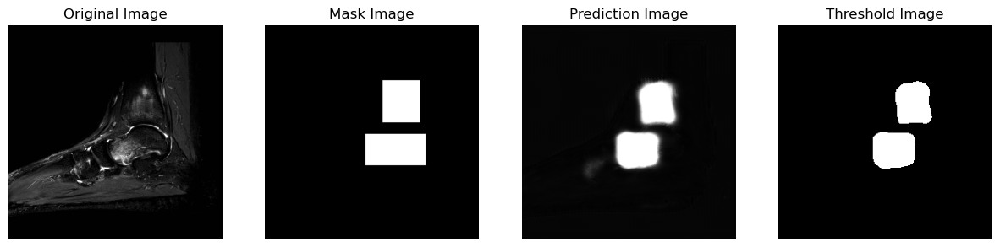

In [45]:
# plot few results
agent_test_l2.printPrediction(loader=test_loader_l2, idx=11, preds=predictions_test_l2)

### Experiment with DiceLoss

Dice coefficient=  2×intersection + smooth / sum of predictions + sum of targets+smooth

Dice loss = 1- dice coefficient
​	

In [93]:
train_flag = True

 # initialize agent
agent_dc = Agent.Agent(train_flag,img_dir=train_dir,msk_dir=mask_dir,folder_path=folder_path, val_dir=val_dir, msk_dir_val=mask_dir_val, 
                  state='new', num_epochs=200, batchSize=30, bilinear=False)
agent_dc.initializeUnet()

# load custom dataset
train_loader_dc, val_loader_dc = agent_dc.loadCustomData(augment=True)

mps
Initialize Custom Data
Augmentation Initialized
Augmentation ::: True
Train flag:: True
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/train_data_SAGIR
Total Size ::: 1118
Initialize Custom Data
Total Size val::: 116


In [94]:
loss_df_dc, prediction_batch_dc, iou_sore_df_dc, loss_val_df_dc, iou_score_val_df_dc, prediction_batch_val_dc = agent_dc.runModel(train_loader_dc, 
                                                                                                                                  val_loader_dc,
                                                                                                                                  earlyStop=True, 
                                                                                                                                  L2Reg=True,
                                                                                                                                  loss='DICE')

Epoch [1/200], Train( Loss: 0.8743, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.9141, IoU_score: 0.0454 )
Epoch [2/200], Train( Loss: 0.8490, IoU_score: 0.0538 ) ::: Validation ( Loss: 0.8715, IoU_score: 0.0454 )
Epoch [3/200], Train( Loss: 0.8326, IoU_score: 0.0800 ) ::: Validation ( Loss: 0.8639, IoU_score: 0.0478 )
Epoch [4/200], Train( Loss: 0.8143, IoU_score: 0.1132 ) ::: Validation ( Loss: 0.8625, IoU_score: 0.0957 )
Epoch [5/200], Train( Loss: 0.7930, IoU_score: 0.1273 ) ::: Validation ( Loss: 0.8330, IoU_score: 0.1173 )
Epoch [6/200], Train( Loss: 0.7637, IoU_score: 0.1679 ) ::: Validation ( Loss: 0.8049, IoU_score: 0.1486 )
Epoch [7/200], Train( Loss: 0.7216, IoU_score: 0.2353 ) ::: Validation ( Loss: 0.7496, IoU_score: 0.2708 )
Epoch [8/200], Train( Loss: 0.6697, IoU_score: 0.3069 ) ::: Validation ( Loss: 0.7882, IoU_score: 0.2358 )
EarlyStopping counter: 1 out of 5
Epoch [9/200], Train( Loss: 0.6068, IoU_score: 0.3850 ) ::: Validation ( Loss: 0.7428, IoU_score: 0.1526 )
Epo

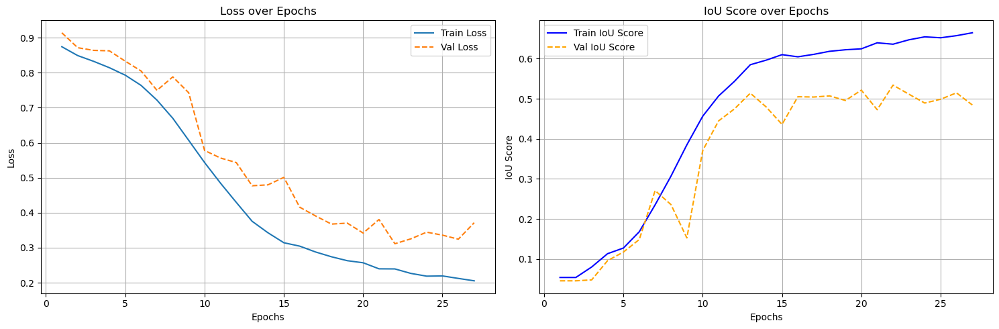

In [95]:
# plot the training and validaiton data
plotResult.plotLoss_IOU(loss_df_dc, iou_sore_df_dc, loss_val_df_dc, iou_score_val_df_dc)

In [96]:
# write the data to the files and save the net
w_path = os.path.join(folder_path,"Result","IoUScore_dc.csv")
agent_dc.writeRun(iou_sore_df_dc,w_path)

# write the loss data
w_path = os.path.join(folder_path,"Result","LossOutput_dc.csv")
agent_dc.writeRun(loss_df_dc,w_path)

# save the net
agent_dc.save_net(file_name='UNet_dc')

### Test the model dice loss

In [97]:
train_flag = False

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_dc = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=186, bilinear=False)
agent_test_dc.initializeUnet('UNet_dcJul 02, 2024 02_10PM')

test_loader_dc = agent_test_dc.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


0.5672457593906617
Iou Score ::::0.5672457593906617
185


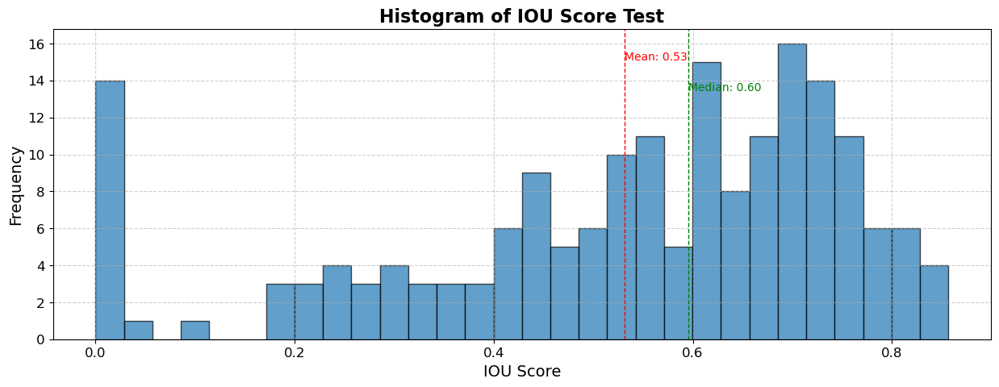

In [98]:
prediction_batch_test_dc, iou_score_batch_test_dc, iou_score_each_test_dc = agent_test_dc.runModel(test_loader_dc)
print(len(iou_score_each_test_dc))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test_dc)

In [99]:
# join the predictions of the test
predictions_test_dc = list(chain(*prediction_batch_test_dc))

P044 SAGIR_006.jpg


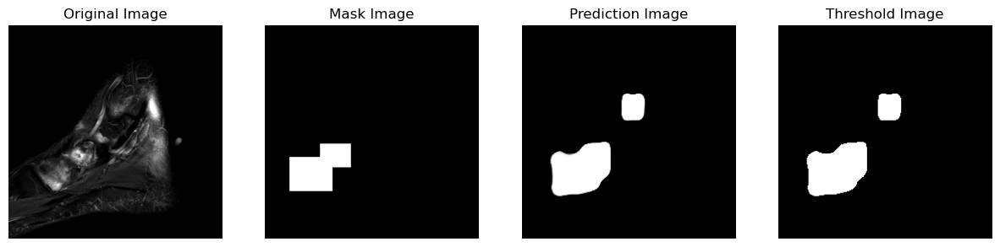

P044 SAGIR_012.jpg


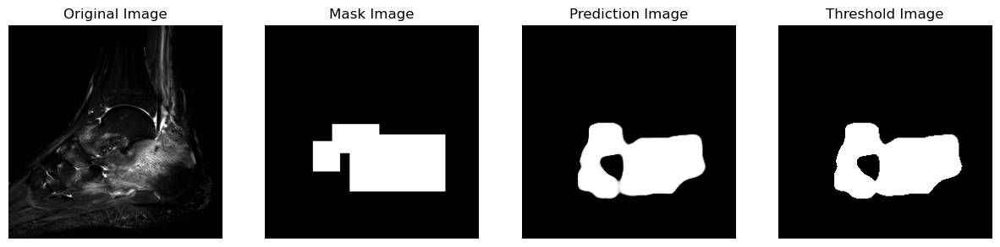

P044 SAGIR_013.jpg


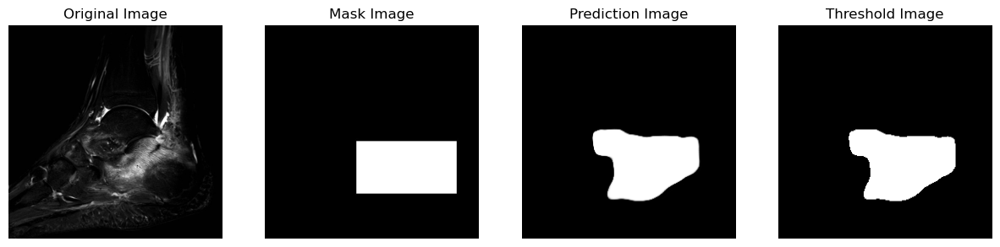

P044 SAGIR_007.jpg


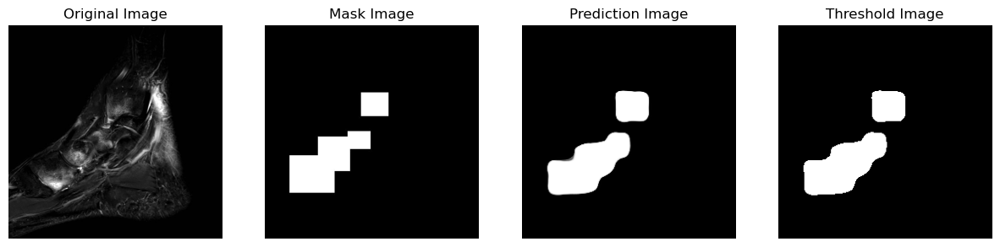

P053 SAGIR_013.jpg


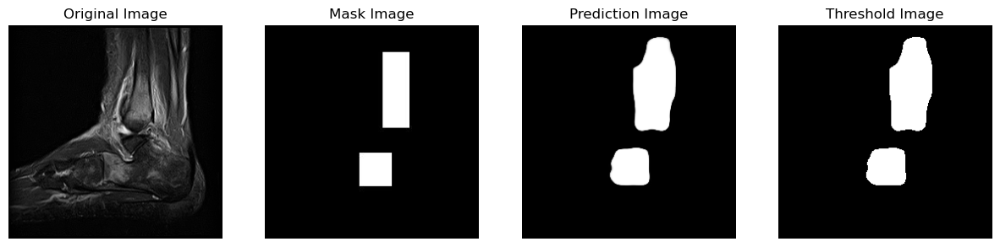

P020 SAGIR_015.jpg


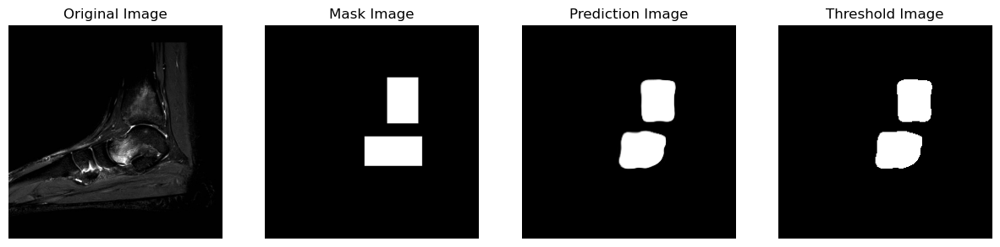

P027 SAGIR_011.jpg


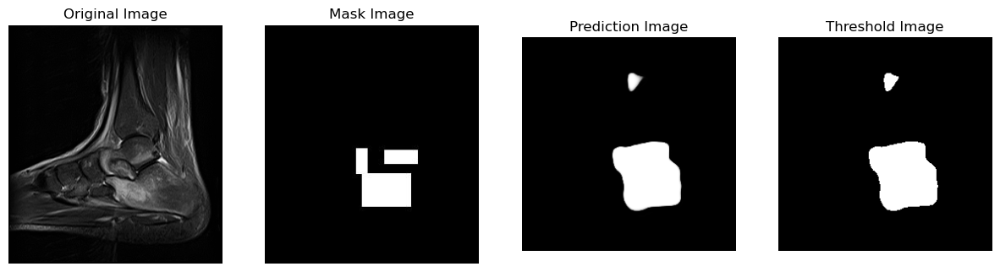

P057 SAGIR_012.jpg


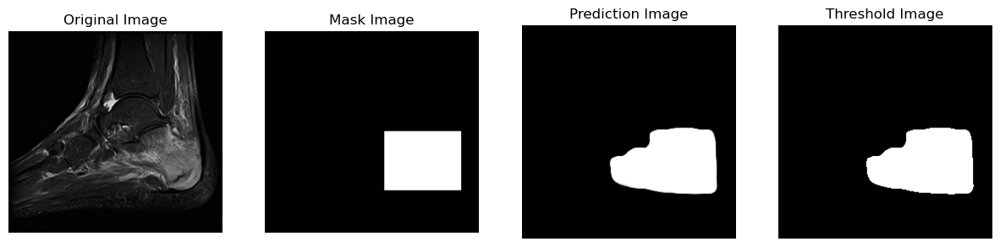

P056 SAGIR_008.jpg


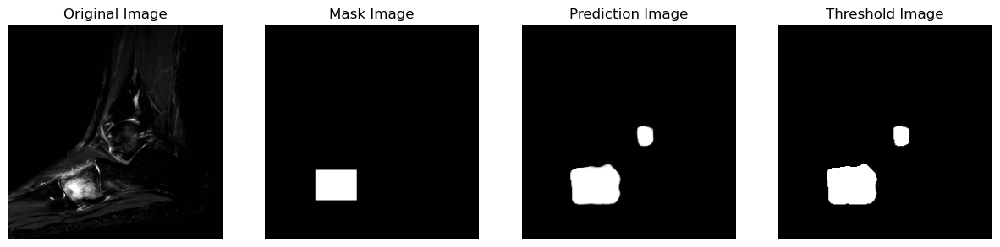

P057 SAGIR_016.jpg


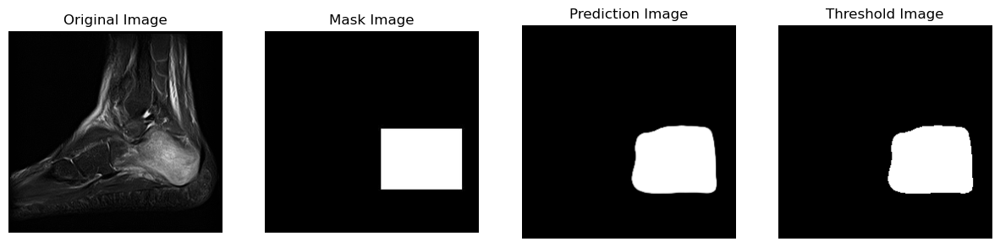

In [100]:
# plot few results
agent_test_dc.printPrediction(loader=test_loader_dc, idx=22, preds=predictions_test_dc)

### Train model with bilinear interpolation

In [110]:
train_flag = True

 # initialize agent
agent_dc_bl = Agent.Agent(train_flag,img_dir=train_dir,msk_dir=mask_dir,folder_path=folder_path, val_dir=val_dir, msk_dir_val=mask_dir_val, 
                  state='new', num_epochs=200, batchSize=30, bilinear=True)
agent_dc_bl.initializeUnet()

# load custom dataset
train_loader_dc_bl, val_loader_dc_bl = agent_dc_bl.loadCustomData(augment=True)

mps
Initialize Custom Data
Augmentation Initialized
Augmentation ::: True
Train flag:: True
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/train_data_SAGIR
Total Size ::: 1118
Initialize Custom Data
Total Size val::: 116


In [111]:
loss_df_dc_bl, prediction_batch_dc_bl, iou_sore_df_dc_bl, loss_val_df_dc_bl, iou_score_val_df_dc_bl, prediction_batch_val_dc_bl = agent_dc_bl.runModel(train_loader_dc_bl, 
                                                                                                                                  val_loader_dc_bl,
                                                                                                                                  earlyStop=True, 
                                                                                                                                  L2Reg=True,
                                                                                                                                  loss='DICE')

Epoch [1/200], Train( Loss: 0.8755, IoU_score: 0.0844 ) ::: Validation ( Loss: 0.9092, IoU_score: 0.0454 )
Epoch [2/200], Train( Loss: 0.8372, IoU_score: 0.1145 ) ::: Validation ( Loss: 0.8698, IoU_score: 0.1026 )
Epoch [3/200], Train( Loss: 0.8021, IoU_score: 0.1431 ) ::: Validation ( Loss: 0.8478, IoU_score: 0.1498 )
Epoch [4/200], Train( Loss: 0.7634, IoU_score: 0.1782 ) ::: Validation ( Loss: 0.8368, IoU_score: 0.2193 )
Epoch [5/200], Train( Loss: 0.7195, IoU_score: 0.2165 ) ::: Validation ( Loss: 0.8271, IoU_score: 0.1625 )
Epoch [6/200], Train( Loss: 0.6661, IoU_score: 0.2875 ) ::: Validation ( Loss: 0.6713, IoU_score: 0.3421 )
Epoch [7/200], Train( Loss: 0.6084, IoU_score: 0.3515 ) ::: Validation ( Loss: 0.6887, IoU_score: 0.2129 )
EarlyStopping counter: 1 out of 5
Epoch [8/200], Train( Loss: 0.5361, IoU_score: 0.4923 ) ::: Validation ( Loss: 0.5896, IoU_score: 0.4422 )
Epoch [9/200], Train( Loss: 0.4648, IoU_score: 0.5478 ) ::: Validation ( Loss: 0.5247, IoU_score: 0.4524 )
Epo

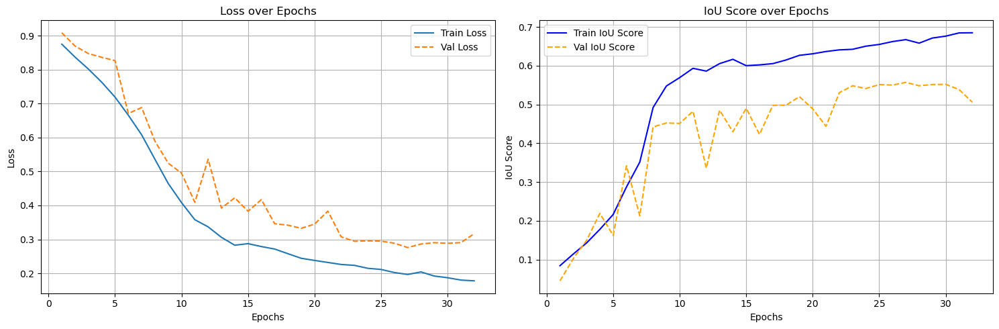

In [112]:
# plot the training and validaiton data
plotResult.plotLoss_IOU(loss_df_dc_bl, iou_sore_df_dc_bl, loss_val_df_dc_bl, iou_score_val_df_dc_bl)

In [113]:
# write the data to the files and save the net
w_path = os.path.join(folder_path,"Result","IoUScore_dc_bl.csv")
agent_dc.writeRun(iou_sore_df_dc_bl,w_path)

# write the loss data
w_path = os.path.join(folder_path,"Result","LossOutput_dc_bl.csv")
agent_dc.writeRun(loss_df_dc_bl,w_path)

# save the net
agent_dc.save_net(file_name='UNet_dc_bl')

### Test the bilinear model

In [116]:
train_flag = False

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_dc_bl = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=185, bilinear=True)
agent_test_dc_bl.initializeUnet('UNet_dc_blJul 16, 2024 11_25PM')

test_loader_dc_bl = agent_test_dc_bl.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


0.5672457593906617
Iou Score ::::0.5672457593906617
185


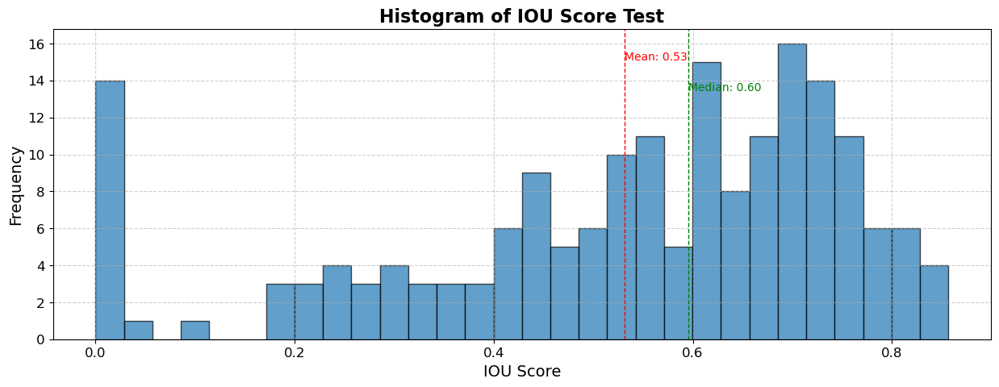

In [117]:
prediction_batch_test_dc_bl, iou_score_batch_test_dc_bl, iou_score_each_test_dc_bl = agent_test_dc_bl.runModel(test_loader_dc_bl)
print(len(iou_score_each_test_dc_bl))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test_dc_bl)

In [108]:
# join the predictions of the test
predictions_test_dc_bl = list(chain(*prediction_batch_test_dc_bl))

P044 SAGIR_006.jpg


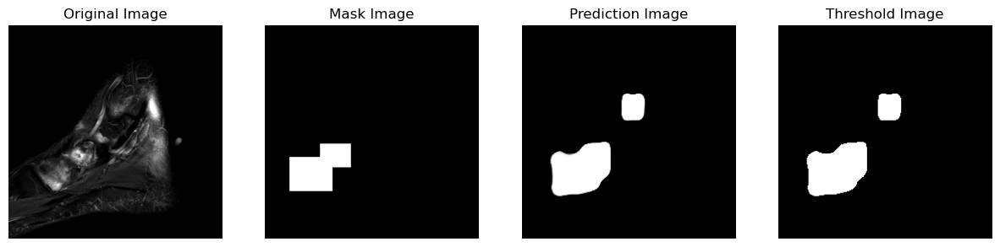

P044 SAGIR_012.jpg


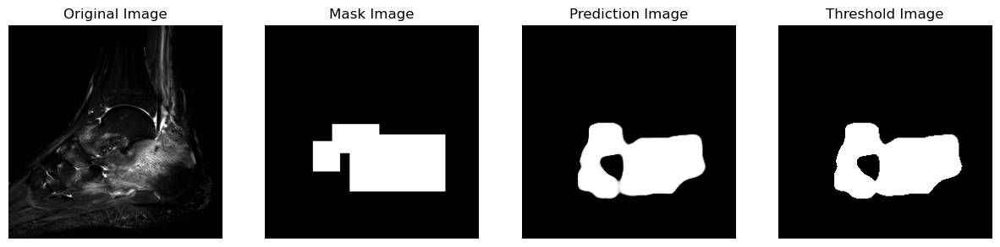

P044 SAGIR_013.jpg


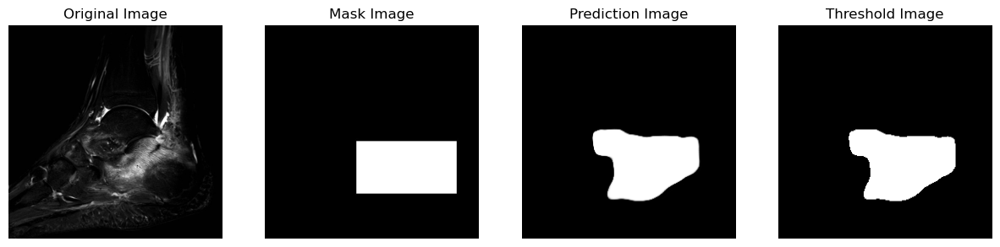

P044 SAGIR_007.jpg


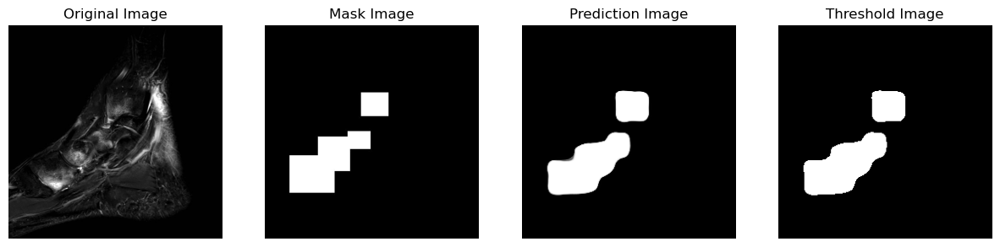

P053 SAGIR_013.jpg


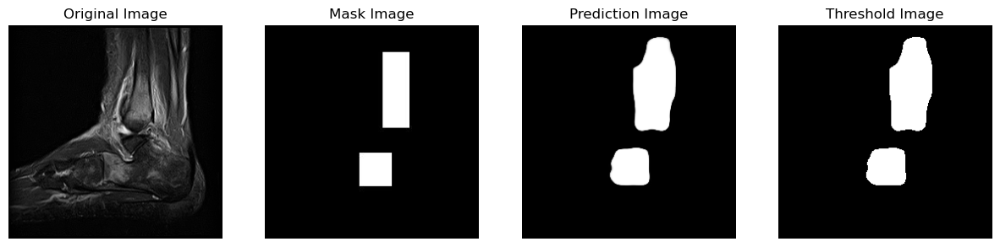

P020 SAGIR_015.jpg


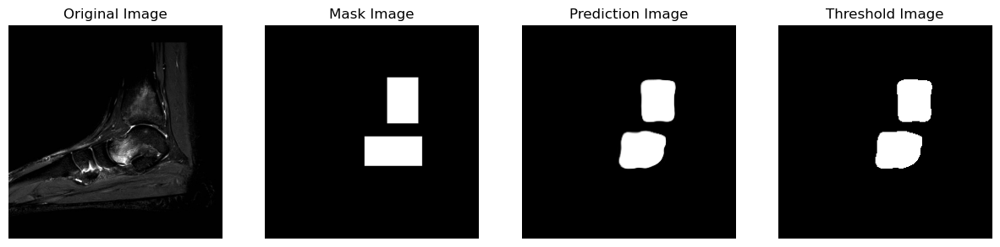

P027 SAGIR_011.jpg


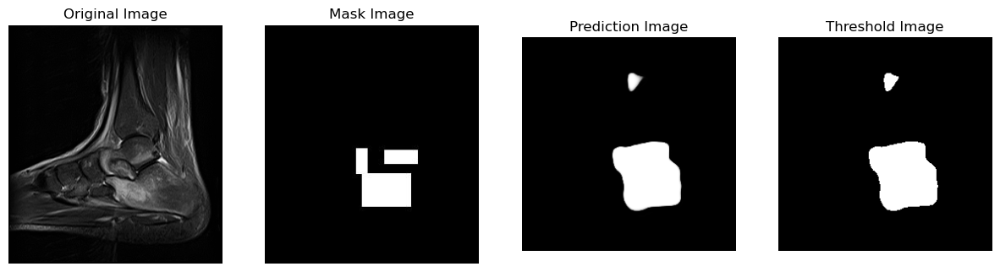

P057 SAGIR_012.jpg


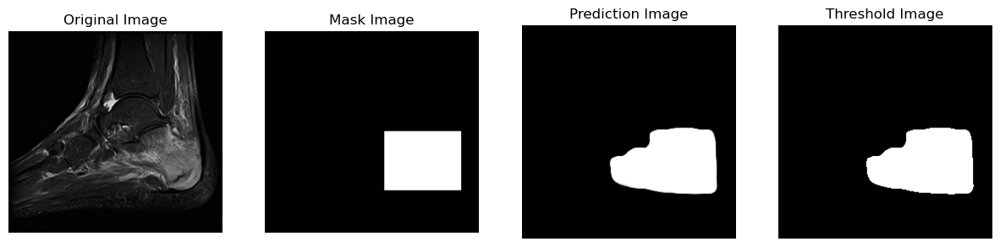

P056 SAGIR_008.jpg


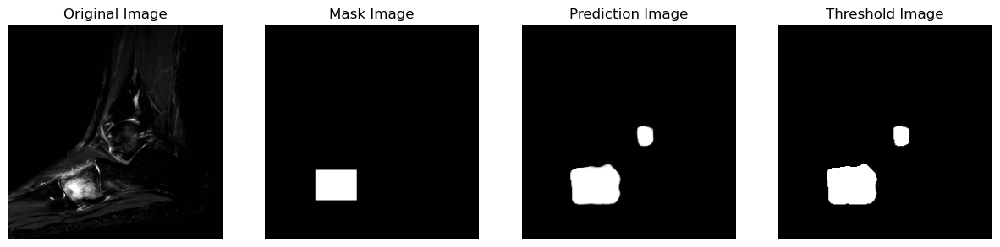

P057 SAGIR_016.jpg


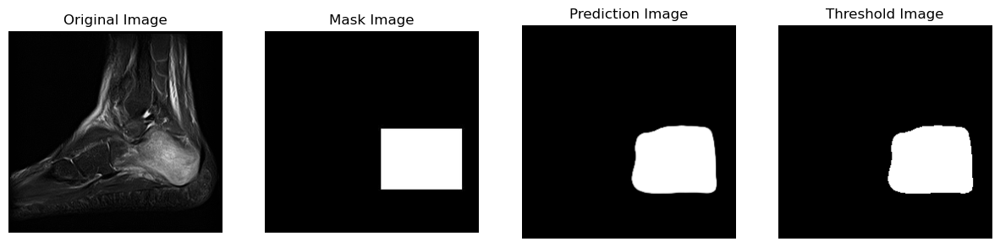

In [109]:
# plot few results
agent_test_dc_bl.printPrediction(loader=test_loader_dc_bl, idx=22, preds=predictions_test_dc_bl)

### Test model with healthy images to copmare results

In [3]:
import os
from PIL import Image

In [8]:
healthy_dir = {}

healthy_dir['SAGIR'] = os.path.join(folder_path, "healthy_SAGIR")
healthy_dir['SAGT1'] = os.path.join(folder_path, "healthy_SAGT1")

In [10]:
healthy_mask_dir = {}
healthy_mask_SAGT1 = os.path.join(folder_path, 'healthy_mask_SAGT1')
healthy_mask_SAGIR = os.path.join(folder_path, 'healthy_mask_SAGIR')

healthy_mask_dir['SAGIR'] = healthy_mask_SAGIR
healthy_mask_dir['SAGT1'] = healthy_mask_SAGT1

img = 'SAGIR'
# set the directories
test_dir = healthy_dir[img]
mask_dir_test = healthy_mask_dir[img]


In [203]:

# create heanlthy black mask for each healthy files
counter = 0
for root, dir, files in os.walk(test_dir):
     for file_name in files:
          
          file_path = os.path.join(root, file_name)
            
          file = Image.open(file_path)
          # get the height and width
          wd, ht = file.size

          # create a balck mask
          # Create an empty image with a white background
          mask_image = Image.new("L", (wd, ht), 255)  # 'L' mode is for grayscale (0-255)

          # save the mask
          mask_image.save(f"{mask_dir_test}/{file_name}")
          counter +=1  


print(f"Total Mask Created::{counter}")

Total Mask Created::299


In [9]:
train_flag = False

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_healthy = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',
                                 num_epochs=1, batchSize=93, bilinear=False)
agent_test_healthy.initializeUnet('UNet_dcJul 02, 2024 02_10PM')

test_loader_healthy = agent_test_healthy.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/healthy_SAGIR
Total Size ::: 93


0.0
Iou Score ::::0.0
93


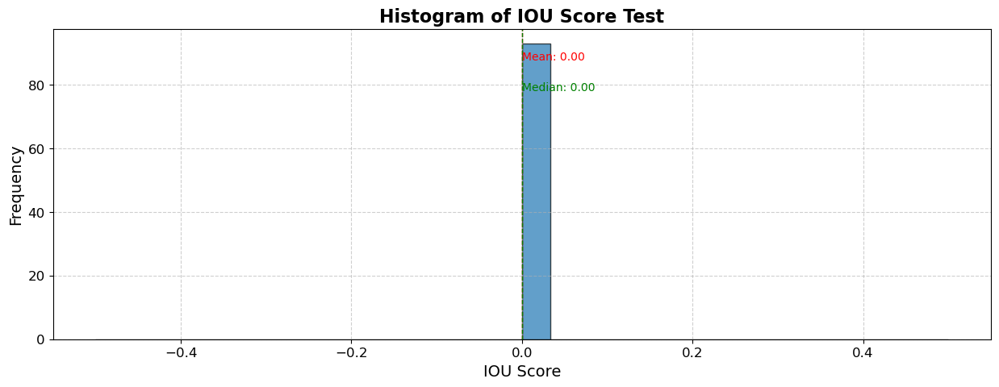

In [10]:
prediction_batch_test_hl, iou_score_batch_test_hl, iou_score_each_test_hl = agent_test_healthy.runModel(test_loader_healthy)
print(len(iou_score_each_test_hl))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test_hl)

In [11]:
# join the predictions of the test
predictions_test_hl = list(chain(*prediction_batch_test_hl))

P003 SAGIR_001.jpg


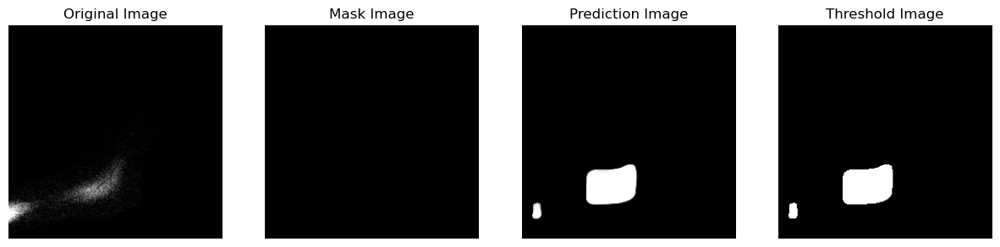

P003 SAGIR_015.jpg


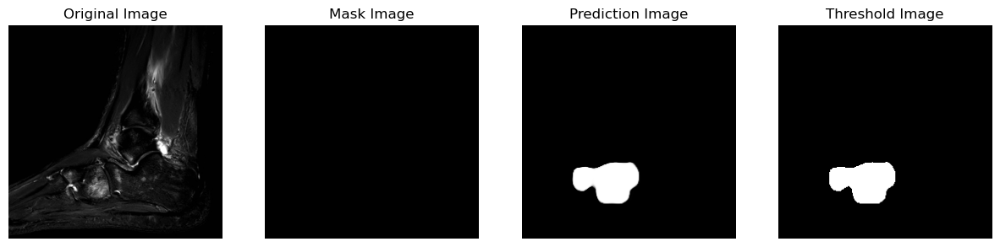

P002 SAGIR_023.jpg


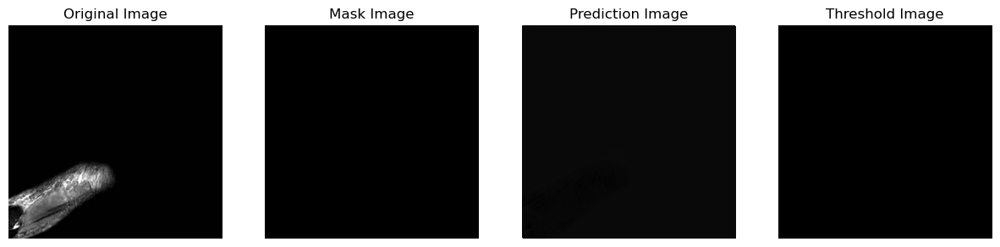

P003 SAGIR_011.jpg


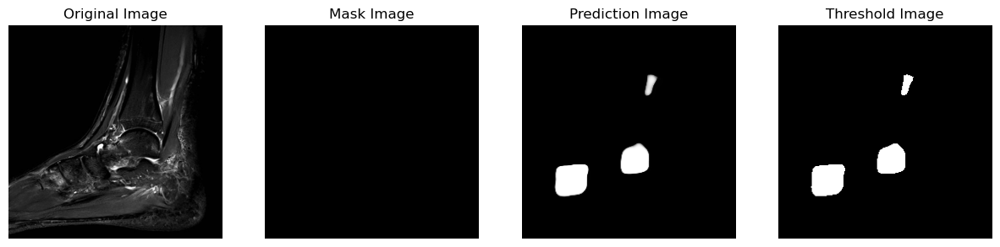

P003 SAGIR_005.jpg


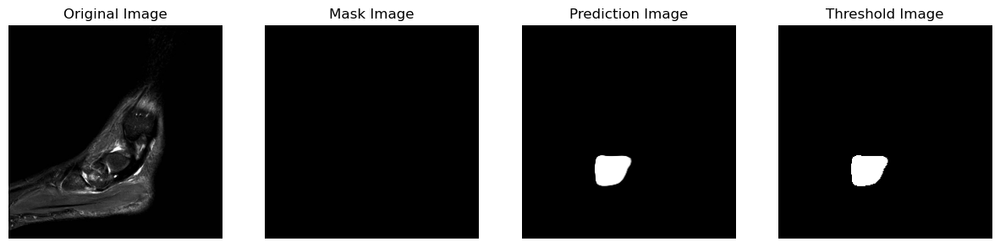

P007 SAGIR_004.jpg


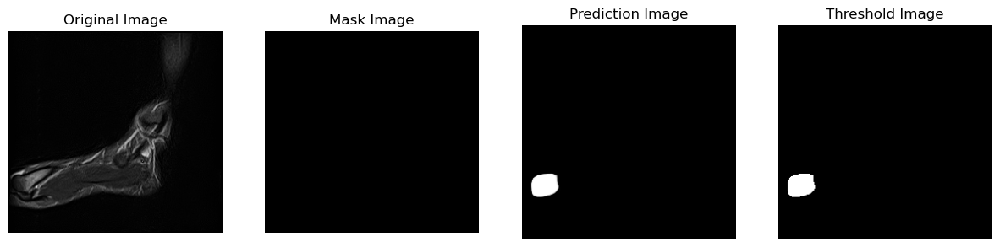

P004 SAGIR_001.jpg


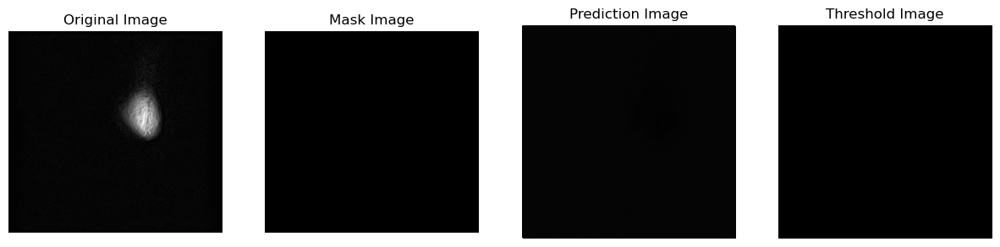

P004 SAGIR_015.jpg


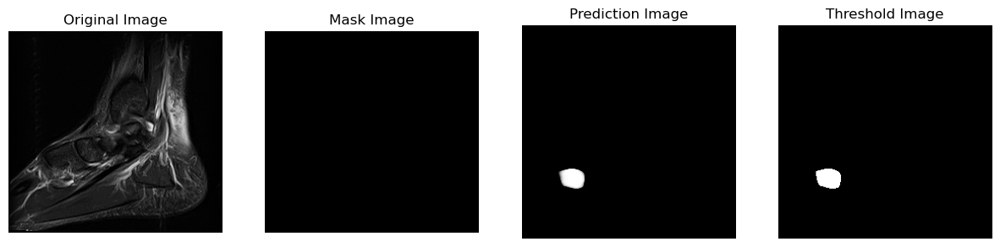

P004 SAGIR_014.jpg


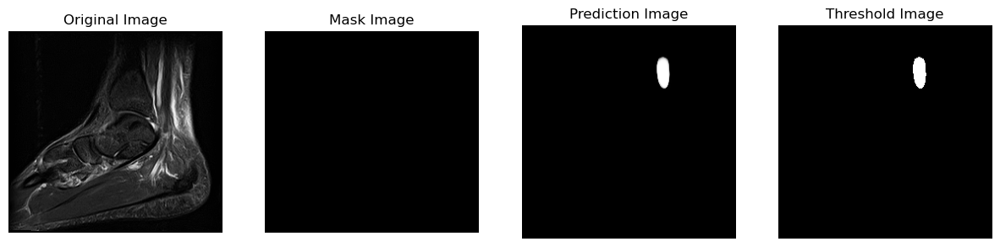

P007 SAGIR_005.jpg


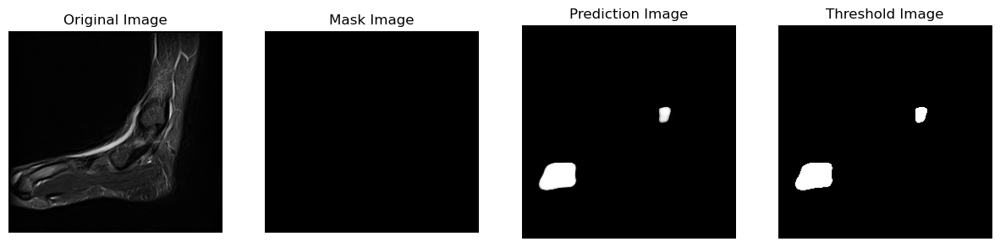

In [12]:
# plot few results
agent_test_healthy.printPrediction(loader=test_loader_healthy, idx=22, preds=predictions_test_hl)

In [13]:
# convert all the healthy mask to white
import os
from PIL import Image

# Define the directory containing the images
directory = mask_dir_test

# Loop through all files in the directory
for filename in os.listdir(directory):
    # Check if the file is an image (you can add more image extensions if needed)
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
        # Full path to the image file
        img_path = os.path.join(directory, filename)
        
        # Open the image file
        with Image.open(img_path) as img:
            # Create an all-white image with the same size as the original image
            white_img = Image.new("L", img.size, color=255)
            
            # Save the all-white image back to the directory with the same filename
            white_img.save(img_path)

print("All images have been converted to white.")

All images have been converted to white.


In [11]:
train_flag = False

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_healthy = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',
                                 num_epochs=1, batchSize=299, bilinear=False)
agent_test_healthy.initializeUnet('UNet_dcJul 02, 2024 02_10PM')

test_loader_healthy = agent_test_healthy.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/healthy_SAGIR
Total Size ::: 299


0.021277131045542432
Iou Score ::::0.021277131045542432
299


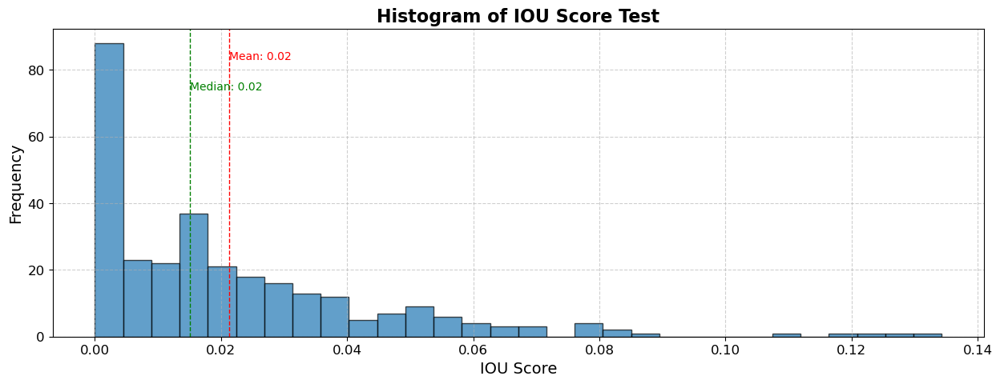

In [12]:
prediction_batch_test_hl, iou_score_batch_test_hl, iou_score_each_test_hl = agent_test_healthy.runModel(test_loader_healthy)
print(len(iou_score_each_test_hl))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test_hl)

In [13]:
# join the predictions of the test
predictions_test_hl = list(chain(*prediction_batch_test_hl))

P057 SAGIR_006.jpg


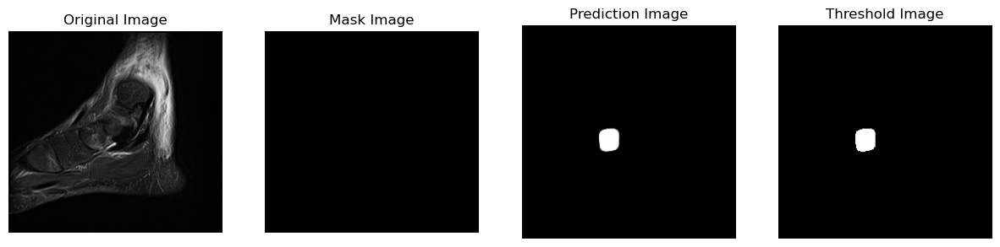

P011 SAGIR_018 (Custom).jpg


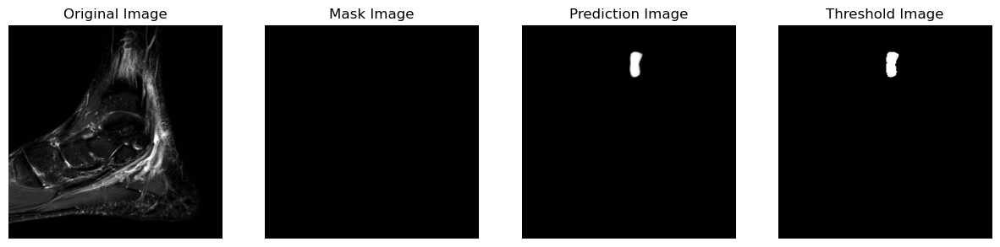

P033 SAGIR_010.jpg


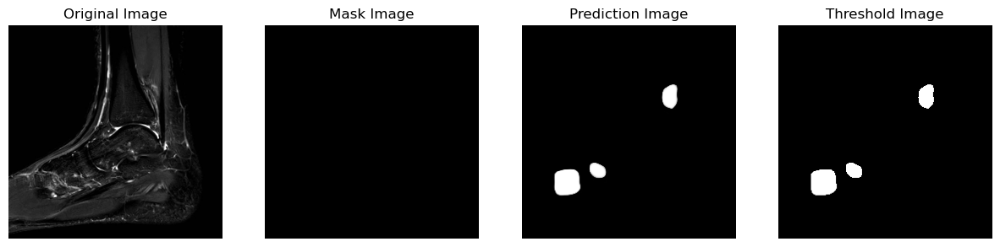

P027 SAGIR_015.jpg


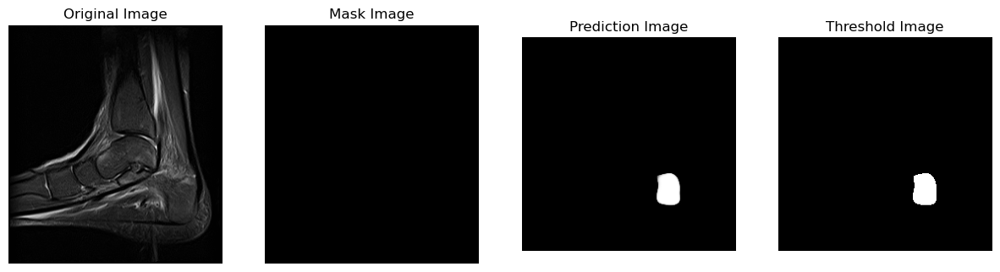

P068 SAGIR_020.jpg


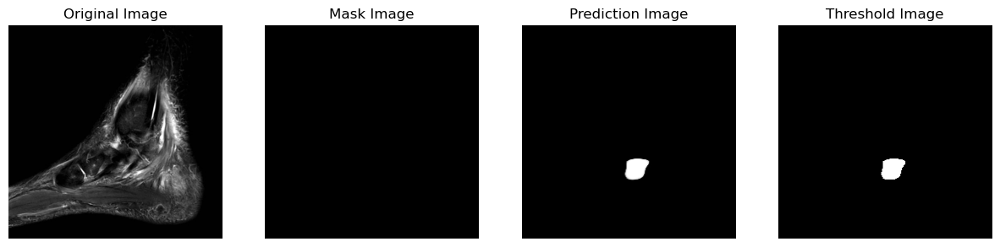

P055 SAGIR_021.jpg


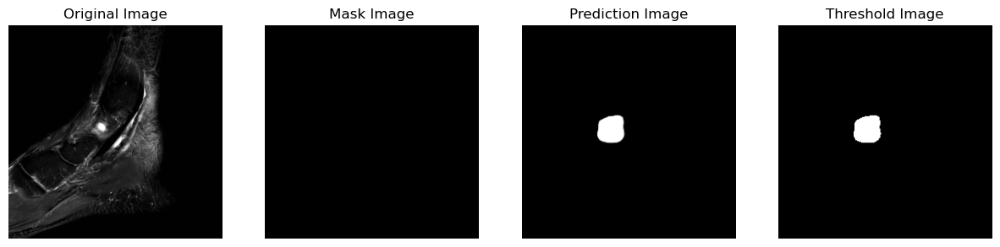

P050 SAGIR_012.jpg


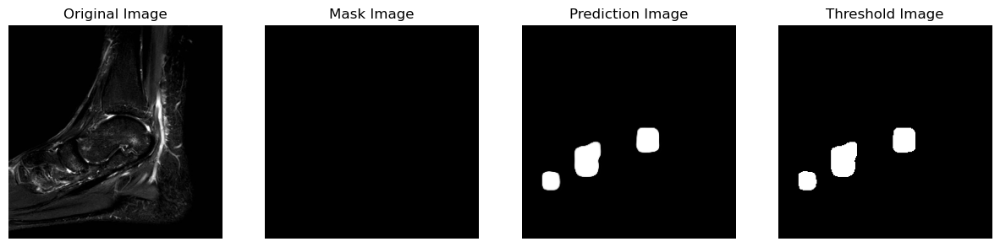

P055 SAGIR_020.jpg


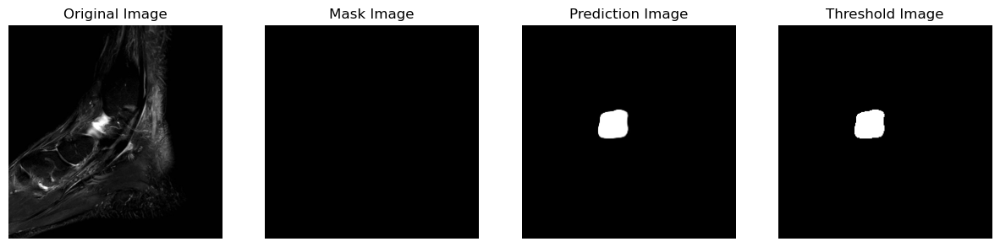

P040 SAGIR_017.jpg


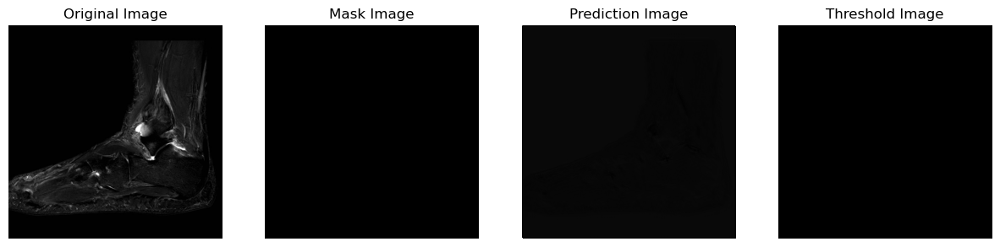

P033 SAGIR_011.jpg


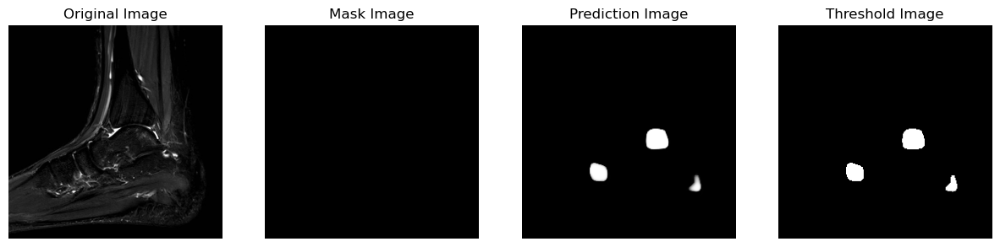

In [16]:
# plot few results
agent_test_healthy.printPrediction(loader=test_loader_healthy, idx=28, preds=predictions_test_hl)

In [184]:
# image_path = healthy_dir['SAGIR']+"/P005 SAGIR_001.jpg"  # Replace with the path to your image file
# img = Image.open(image_path)
# i_size = img.size
# img_gray = img.convert("L")
# img_array = np.array(img_gray)

### Test with healthy and unhealty data

In [17]:
img = 'SAGIR'
# set the directories
test_dir = os.path.join(folder_path, 'mix_SAGIR')
mask_dir_test = os.path.join(folder_path, 'mix_mask_SAGIR')

In [19]:
train_flag = False

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_mix = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',
                                 num_epochs=1, batchSize=485, bilinear=False)
agent_test_mix.initializeUnet('UNet_dcJul 02, 2024 02_10PM')

test_loader_mix = agent_test_mix.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/mix_SAGIR
Total Size ::: 484


0.044424602503622665
Iou Score ::::0.044424602503622665
484


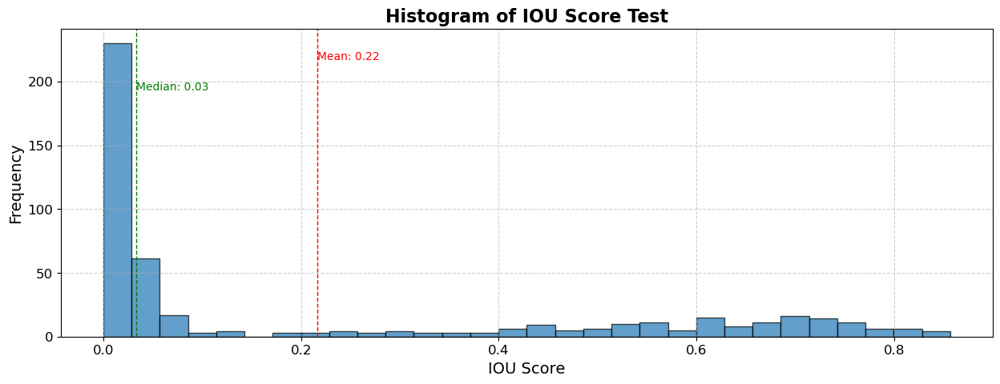

In [20]:
prediction_batch_test_mix, iou_score_batch_test_mix, iou_score_each_test_mix = agent_test_mix.runModel(test_loader_mix)
print(len(iou_score_each_test_mix))
# plot the testing iou histogram
plotResult.plotTest_IOU(iou_score_each_test_mix)

In [21]:
# join the predictions of the test
predictions_test_mix = list(chain(*prediction_batch_test_mix))

P031 SAGIR_009.jpg


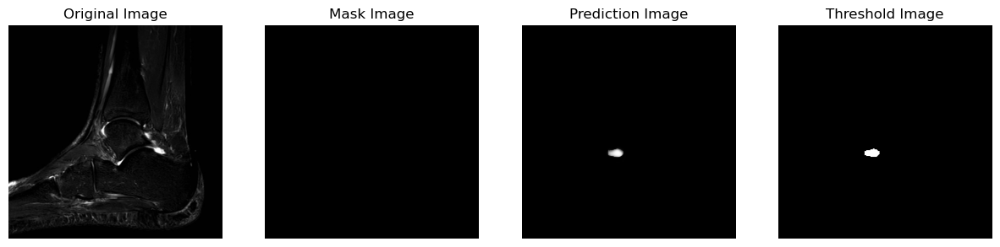

P024 SAGIR_016.jpg


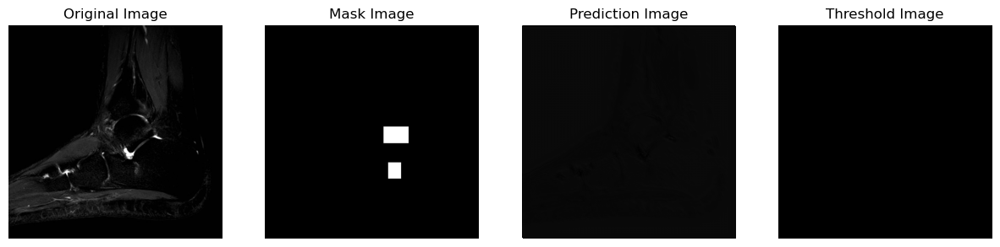

P030 SAGIR_007.jpg


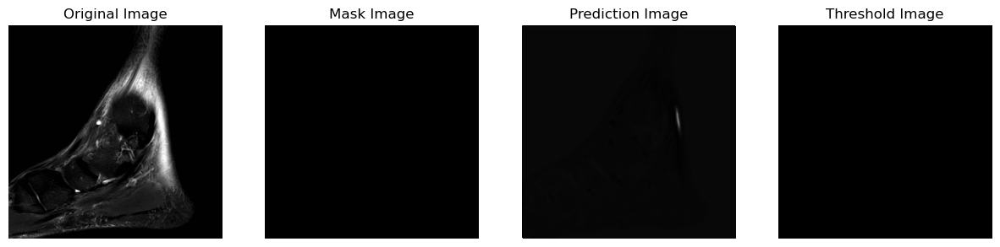

P057 SAGIR_010.jpg


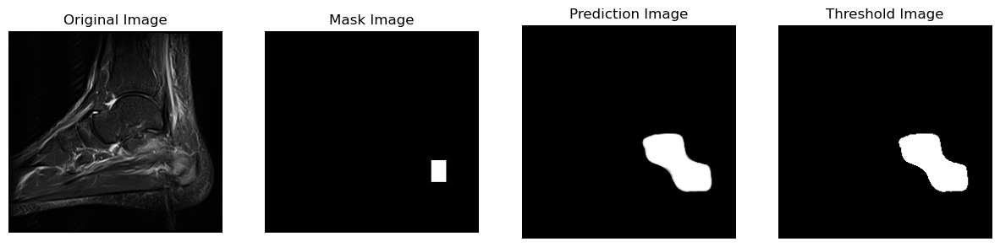

P027 SAGIR_007.jpg


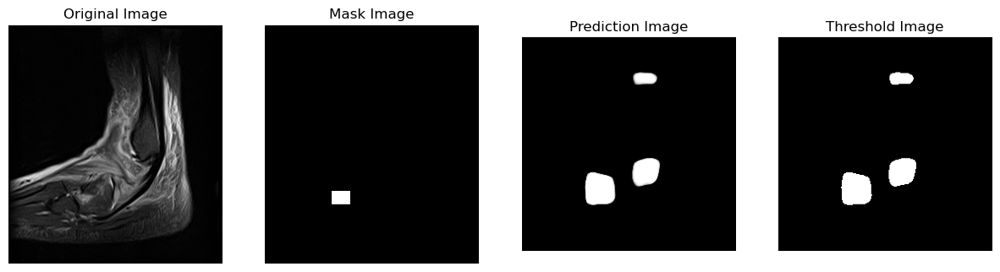

P027 SAGIR_013.jpg


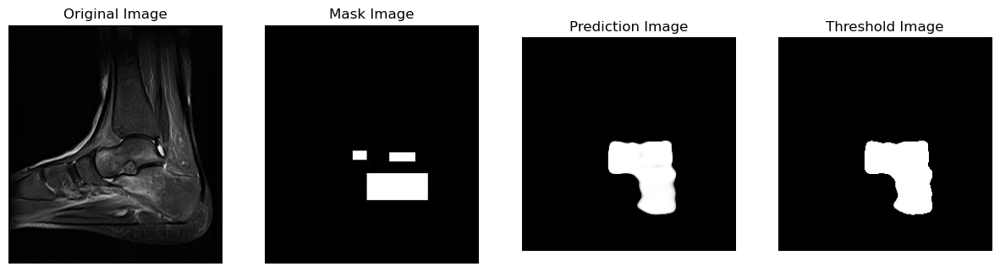

P035 SAGIR_020.jpg


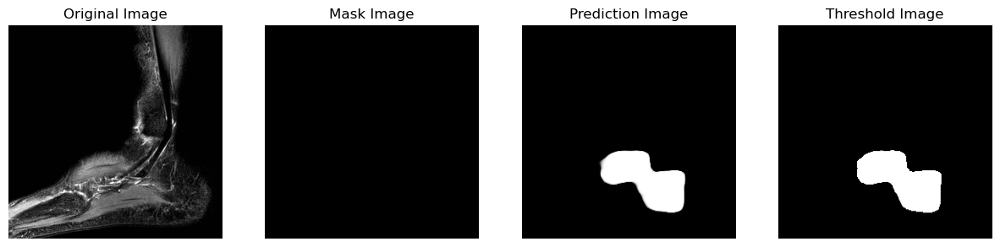

P035 SAGIR_008.jpg


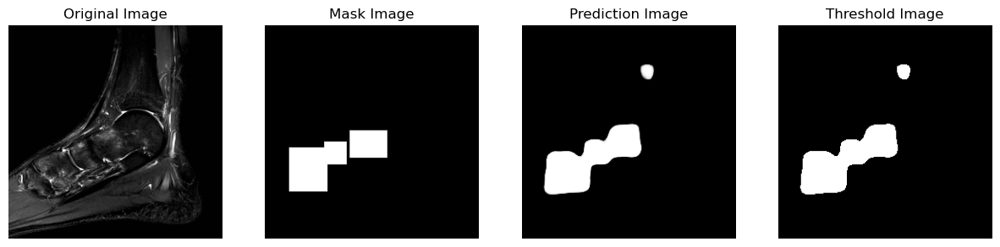

P008 SAGIR_021.jpg


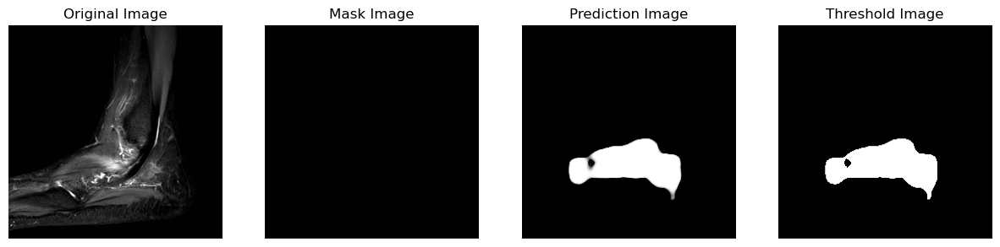

P020 SAGIR_017.jpg


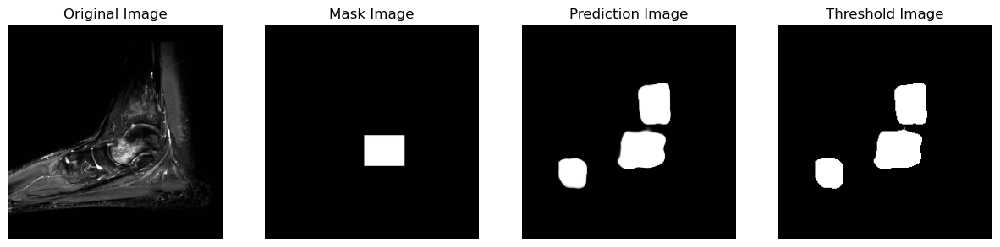

In [44]:
# plot few results
agent_test_mix.printPrediction(loader=test_loader_mix, idx=0, preds=predictions_test_mix)

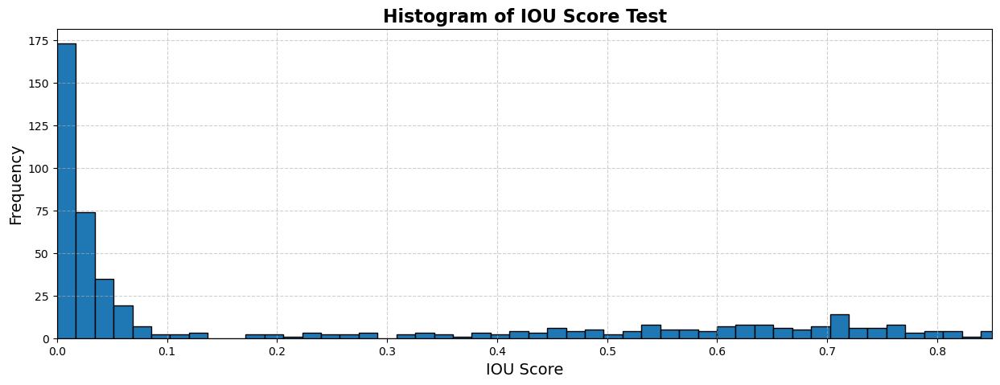

In [42]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

ax.hist(iou_score_each_test_mix, bins=50, color='#1f77b4', edgecolor='black')
ax.grid(True, linestyle='--', alpha=0.6)
ax.set_xlim(0.0, 0.85)
# Set labels and title
ax.set_xlabel("IOU Score", fontsize=14)
ax.set_ylabel("Frequency", fontsize=14)
ax.set_title("Histogram of IOU Score Test", fontsize=16, fontweight='bold')
plt.show()

### Generate a confusion matrix with the predicted data

In [85]:
import pandas as pd

# initialize the image directory and mask directory
imgDir = test_dir
mskDir = mask_dir_test

# get the list of name from the healthy folder
healthy_folder = healthy_dir['SAGIR']
healthy_file_names = os.listdir(healthy_folder)


# function to generate the dataframe for confusion matrix
def cof_mat_data(healthy_file_names, test_loader_mix, iou_score_each_test_mix, thres=0.14):

    df = pd.DataFrame(columns=["FileName", "TrueLabel", "IoUScore", "PredictedLabel"])

    # travers through the loader data and the prediction data and populate the dataframe
    image_names = test_loader_mix.dataset.image_list
    pred_images = predictions_test_mix

    for name, predictions, iou_score in zip(image_names, pred_images, iou_score_each_test_mix): 
   
        # if the file is in the healthy folder then label it as healthy else unhealthy
        if name in healthy_file_names:
            true_label = 'Healthy'
        else:
            true_label = 'Unhealthy'
    
        # if the iou_score is <=0.14 then the prediction is healthy else unhealthy
        if iou_score <= thres:
            predicted_label = 'Healthy'
        else:
            predicted_label = 'Unhealthy'

        # populate the data frame with the data
        new_data = pd.DataFrame({
        "FileName": [name],
        "TrueLabel": [true_label],
        "IoUScore": [iou_score],
        "PredictedLabel": [predicted_label]
        })

        df = pd.concat([df, new_data], ignore_index=True)

    
    return df



df = cof_mat_data(healthy_file_names, test_loader_mix, iou_score_each_test_mix, thres=0.14)

df

/var/folders/g_/gvj4l8c56x5dnb0wz24b42tm0000gn/T/ipykernel_90286/2208314668.py:43: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, new_data], ignore_index=True)


,FileName,TrueLabel,IoUScore,PredictedLabel
0,P031 SAGIR_009.jpg,Healthy,0.002060,Healthy
1,P024 SAGIR_016.jpg,Unhealthy,0.000000,Healthy
2,P030 SAGIR_007.jpg,Healthy,0.000000,Healthy
3,P057 SAGIR_010.jpg,Unhealthy,0.239046,Unhealthy
4,P027 SAGIR_007.jpg,Unhealthy,0.184274,Unhealthy
...,...,...,...,...
479,P055 SAGIR_016.jpg,Healthy,0.020248,Healthy
480,P057 SAGIR_009.jpg,Healthy,0.000000,Healthy
481,P030 SAGIR_022.jpg,Healthy,0.028351,Healthy
482,P056 SAGIR_007.jpg,Unhealthy,0.726831,Unhealthy


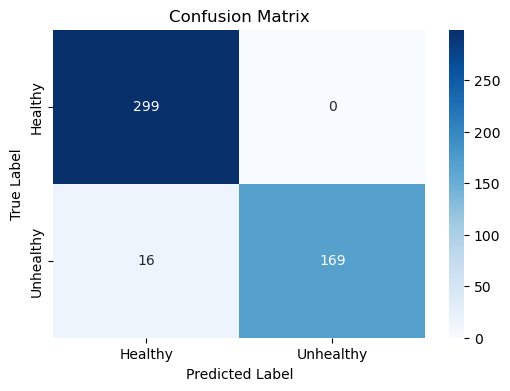

In [88]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def plotConfMat(df):
    
    # confusion matrix
    # Generate the confusion matrix
    cm = confusion_matrix(df['TrueLabel'], df['PredictedLabel'], labels=["Healthy", "Unhealthy"])

    # Plot the confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Healthy", "Unhealthy"], yticklabels=["Healthy", "Unhealthy"])

    # Add labels and title
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")

    # Show the plot
    plt.show()

    return cm


cm = plotConfMat(df)   

In [61]:
from sklearn.metrics import classification_report

print(classification_report(df['TrueLabel'], df['PredictedLabel']))

              precision    recall  f1-score   support

     Healthy       0.95      1.00      0.97       299
   Unhealthy       1.00      0.91      0.95       185

    accuracy                           0.97       484
   macro avg       0.97      0.96      0.96       484
weighted avg       0.97      0.97      0.97       484



In [80]:
df.head()

,FileName,TrueLabel,IoUScore,PredictedLabel
0,P031 SAGIR_009.jpg,Healthy,0.002060,Healthy
1,P024 SAGIR_016.jpg,Unhealthy,0.000000,Healthy
2,P030 SAGIR_007.jpg,Healthy,0.000000,Healthy
3,P057 SAGIR_010.jpg,Unhealthy,0.239046,Unhealthy
4,P027 SAGIR_007.jpg,Unhealthy,0.184274,Unhealthy


In [81]:
from sklearn.metrics import roc_curve, auc

# Generate ROC curve values
fpr, tpr, thresholds = roc_curve(df['TrueLabel'], df['IoUScore'], pos_label="Unhealthy")

# Calculate the AUC (Area Under Curve)
roc_auc = auc(fpr, tpr)

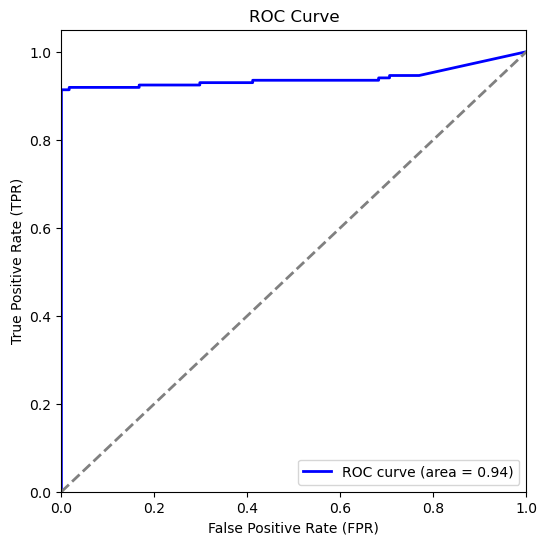

In [87]:
def plotROC(fpr, tpr, roc_auc):
    
    # Plot the ROC curve
    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')  # Diagonal line

    # Labels and title
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")

    # Show the plot
    plt.show()

plotROC(fpr, tpr, roc_auc)

In [83]:
tn, fp, fn, tp = cm.ravel()

In [84]:
specificity = tn / (tn + fp)
print(f"Specificity: {specificity:.2f}")

Specificity: 1.00


In [89]:
## check for other threshold ## 0.06
df = cof_mat_data(healthy_file_names, test_loader_mix, iou_score_each_test_mix, thres=0.06)
df

/var/folders/g_/gvj4l8c56x5dnb0wz24b42tm0000gn/T/ipykernel_90286/2208314668.py:43: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, new_data], ignore_index=True)


,FileName,TrueLabel,IoUScore,PredictedLabel
0,P031 SAGIR_009.jpg,Healthy,0.002060,Healthy
1,P024 SAGIR_016.jpg,Unhealthy,0.000000,Healthy
2,P030 SAGIR_007.jpg,Healthy,0.000000,Healthy
3,P057 SAGIR_010.jpg,Unhealthy,0.239046,Unhealthy
4,P027 SAGIR_007.jpg,Unhealthy,0.184274,Unhealthy
...,...,...,...,...
479,P055 SAGIR_016.jpg,Healthy,0.020248,Healthy
480,P057 SAGIR_009.jpg,Healthy,0.000000,Healthy
481,P030 SAGIR_022.jpg,Healthy,0.028351,Healthy
482,P056 SAGIR_007.jpg,Unhealthy,0.726831,Unhealthy


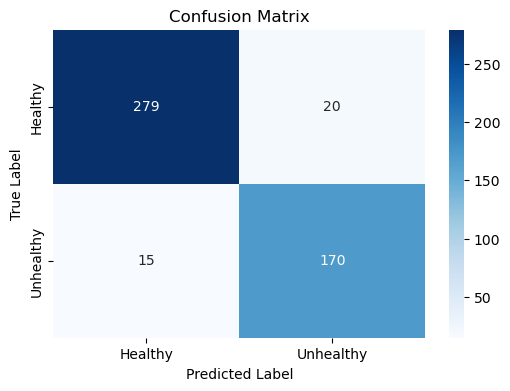

In [90]:
cm = plotConfMat(df)   

In [91]:
print(classification_report(df['TrueLabel'], df['PredictedLabel']))

              precision    recall  f1-score   support

     Healthy       0.95      0.93      0.94       299
   Unhealthy       0.89      0.92      0.91       185

    accuracy                           0.93       484
   macro avg       0.92      0.93      0.92       484
weighted avg       0.93      0.93      0.93       484



In [ ]:
# Generate ROC curve values
fpr, tpr, thresholds = roc_curve(df['TrueLabel'], df['IoUScore'], pos_label="Unhealthy")

# Calculate the AUC (Area Under Curve)
roc_auc = auc(fpr, tpr)

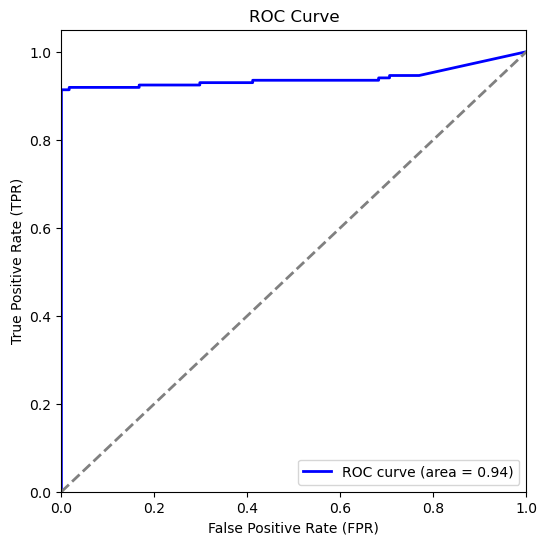

In [92]:
plotROC(fpr, tpr, roc_auc)

In [93]:
tn, fp, fn, tp = cm.ravel()


specificity = tn / (tn + fp)
print(f"Specificity: {specificity:.2f}")


Specificity: 0.93


### Check prediction score of the best edema prediction model

**The best model was the model with dice loss above `UNet_dcJul 02, 2024 02_10PM`**

In [110]:
img='SAGIR'
train_flag = False

# set the directories
test_dir = test_dir_dict[img]
mask_dir_test = test_mask_dir_dict[img]

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_dc = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=186, bilinear=False)
agent_test_dc.initializeUnet('UNet_dcJul 02, 2024 02_10PM')

test_loader_dc = agent_test_dc.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


In [ ]:
prediction_batch_test_dc, iou_score_batch_test_dc, iou_score_each_test_dc = agent_test_dc.runModel(test_loader_dc)
print(len(iou_score_each_test_dc))
# plot the testing iou histogram
#plotResult.plotTest_IOU(iou_score_each_test_dc)

0.5672457593906617
Iou Score ::::0.5672457593906617
185


In [112]:
# join the predictions of the test
predictions_test_dc = list(chain(*prediction_batch_test_dc))

In [113]:
df_edema = agent_test_dc.computePredictionScore(test_loader_dc, predictions_test_dc)
df_edema.head()

,ImageName,Image,TrueMask,PredMask,PredScore,ActualScore
0,P024 SAGIR_016.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.006570888, 0.0008296421, 0.0010359406, 0.0...",0.000930,0.022494
1,P057 SAGIR_010.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.0065705087, 0.0008295714, 0.001035808, 0.0...",0.092602,0.010390
2,P027 SAGIR_007.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.006570197, 0.00082951924, 0.0010357402, 0....",0.090197,0.008146
3,P027 SAGIR_013.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.006570552, 0.00082956743, 0.001035844, 0.0...",0.159564,0.068492
4,P035 SAGIR_008.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.006570888, 0.0008296421, 0.0010359406, 0.0...",0.163741,0.133040


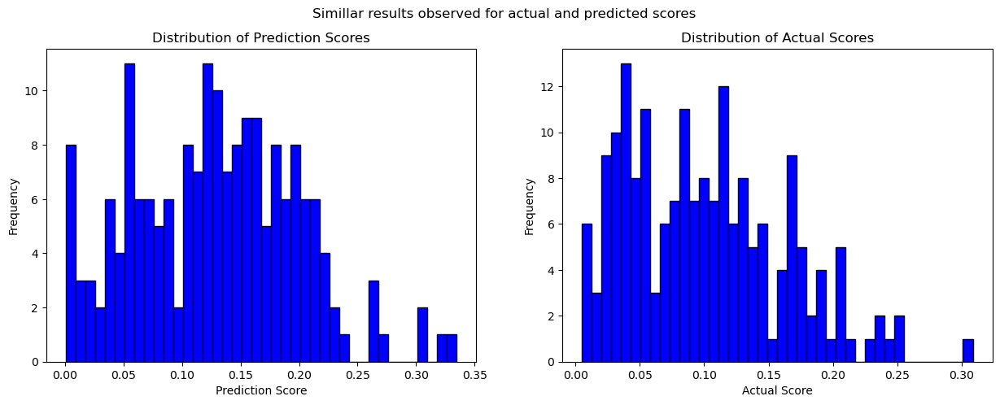

In [114]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1,2, figsize=(15, 5))
ax[0].hist(df_edema['PredScore'], bins=40, color='blue', edgecolor='black')
ax[0].set_title('Distribution of Prediction Scores')
ax[0].set_xlabel('Prediction Score')
ax[0].set_ylabel('Frequency')

ax[1].hist(df_edema['ActualScore'], bins=40, color='blue', edgecolor='black')
ax[1].set_title('Distribution of Actual Scores')
ax[1].set_xlabel('Actual Score')
ax[1].set_ylabel('Frequency')

fig.suptitle("Simillar results observed for actual and predicted scores")
plt.show()

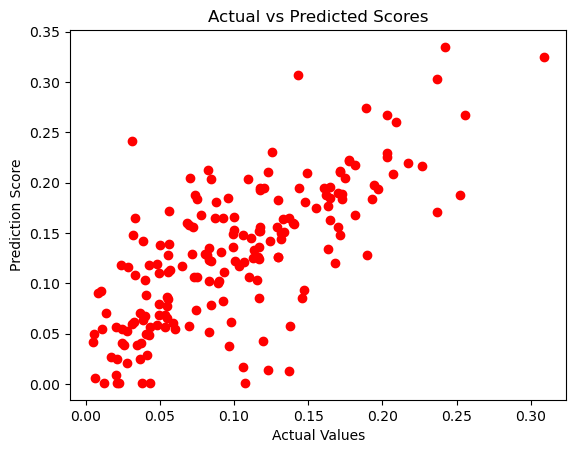

In [115]:
plt.scatter(df_edema['ActualScore'], df_edema['PredScore'], color='red')
plt.title('Actual vs Predicted Scores')
plt.xlabel('Actual Values')
plt.ylabel('Prediction Score')
plt.show()

## Train a model for fracture data

In [66]:
train_dir_frac_SAGIR = os.path.join(folder_path, "train_data_frac_SAGIR")
test_dir_frac_SAGIR = os.path.join(folder_path, "test_data_frac_SAGIR")
val_dir_frac_SAGIR = os.path.join(folder_path, "val_data_frac_SAGIR")

train_mask_frac_SAGIR = os.path.join(folder_path, "train_mask_frac_SAGIR")
test_mask_frac_SAGIR = os.path.join(folder_path, "test_mask_frac_SAGIR")
val_mask_frac_SAGIR = os.path.join(folder_path, "val_mask_frac_SAGIR")

In [20]:
val_dir_frac_SAGIR

'/Users/jiten/Masters/WorkPlace/MRI Fractures Project/val_data_frac_SAGIR'

In [21]:
train_flag = True
train_dir = train_dir_frac_SAGIR
mask_dir = train_mask_frac_SAGIR
val_dir = val_dir_frac_SAGIR
mask_dir_val = val_mask_frac_SAGIR

 # initialize agent
agent_frac = Agent.Agent(train_flag,img_dir=train_dir,msk_dir=mask_dir,folder_path=folder_path, val_dir=val_dir, msk_dir_val=mask_dir_val, 
                  state='new', num_epochs=200, batchSize=30, bilinear=False)
agent_frac.initializeUnet()

# load custom dataset
train_loader_frac, val_loader_frac = agent_frac.loadCustomData(augment=False)

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: True
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/train_data_frac_SAGIR
Total Size ::: 189
Initialize Custom Data
Total Size val::: 44


In [27]:
loss_df_frac, prediction_batch_frac, iou_sore_df_frac, loss_val_df_frac, iou_score_val_df_frac, prediction_batch_val_frac = agent_frac.runModel(train_loader_frac, 
                                                                                                                                  val_loader_frac,
                                                                                                                                  earlyStop=True, 
                                                                                                                                  L2Reg=True,
                                                                                                                                  loss='DICE')

Epoch [1/200], Train( Loss: 0.2138, IoU_score: 0.6775 ) ::: Validation ( Loss: 0.5439, IoU_score: 0.3235 )
Epoch [2/200], Train( Loss: 0.2018, IoU_score: 0.6618 ) ::: Validation ( Loss: 0.5009, IoU_score: 0.3732 )
Epoch [3/200], Train( Loss: 0.1969, IoU_score: 0.6666 ) ::: Validation ( Loss: 0.6159, IoU_score: 0.2300 )
EarlyStopping counter: 1 out of 5
Epoch [4/200], Train( Loss: 0.1681, IoU_score: 0.6705 ) ::: Validation ( Loss: 0.5219, IoU_score: 0.2899 )
EarlyStopping counter: 2 out of 5
Epoch [5/200], Train( Loss: 0.1515, IoU_score: 0.6589 ) ::: Validation ( Loss: 0.5193, IoU_score: 0.3018 )
EarlyStopping counter: 3 out of 5
Epoch [6/200], Train( Loss: 0.1460, IoU_score: 0.6667 ) ::: Validation ( Loss: 0.4937, IoU_score: 0.3140 )
Epoch [7/200], Train( Loss: 0.1473, IoU_score: 0.6637 ) ::: Validation ( Loss: 0.5091, IoU_score: 0.2879 )
EarlyStopping counter: 1 out of 5
Epoch [8/200], Train( Loss: 0.1435, IoU_score: 0.6613 ) ::: Validation ( Loss: 0.5303, IoU_score: 0.2736 )
EarlySto

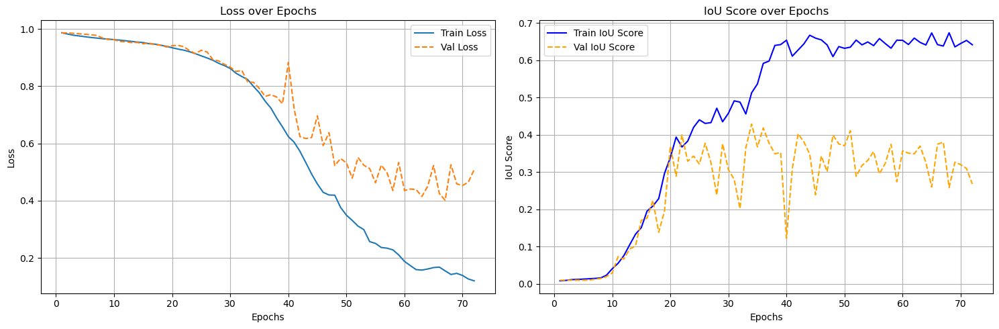

In [23]:
# plot the training and validaiton data
plotResult.plotLoss_IOU(loss_df_frac, iou_sore_df_frac, loss_val_df_frac, iou_score_val_df_frac)

In [28]:
# save the net
agent_frac.save_net(file_name='UNet_frac')

In [116]:
train_flag = False

test_dir = test_dir_frac_SAGIR
mask_dir_test = test_mask_frac_SAGIR

train_flag = False

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_frac_test = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',
                                 num_epochs=1, batchSize=50, bilinear=False)
agent_frac_test.initializeUnet('UNet_fracOct 31, 2024 02_27PM')

test_loader_frac = agent_frac_test.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_frac_SAGIR
Total Size ::: 50


In [117]:
prediction_batch_test_frac, iou_score_batch_test_frac, iou_score_each_test_frac = agent_frac_test.runModel(test_loader_frac)
print(len(iou_score_each_test_frac))

0.30227393853259904
Iou Score ::::0.30227393853259904
50


In [118]:
# join the predictions of the test
predictions_test_frac = list(chain(*prediction_batch_test_frac))

In [119]:
df_frac = agent_frac_test.computePredictionScore(test_loader_frac, predictions_test_frac)
df_frac.head()

,ImageName,Image,TrueMask,PredMask,PredScore,ActualScore
0,P057 SAGIR_010.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.00033193966, 0.00038595323, 0.00056448154,...",0.006784,0.003155
1,P053 SAGIR_011.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.00033090994, 0.0003844044, 0.00056163874, ...",0.001943,0.002565
2,P027 SAGIR_012.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.0003314385, 0.00038500878, 0.0005635542, 0...",0.002194,0.001149
3,P057 SAGIR_011.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.00033172267, 0.00038552994, 0.00056448474,...",0.008357,0.008719
4,P057 SAGIR_013.jpg,"[[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0.00033186024, 0.00038598338, 0.0005646957, ...",0.012487,0.007972


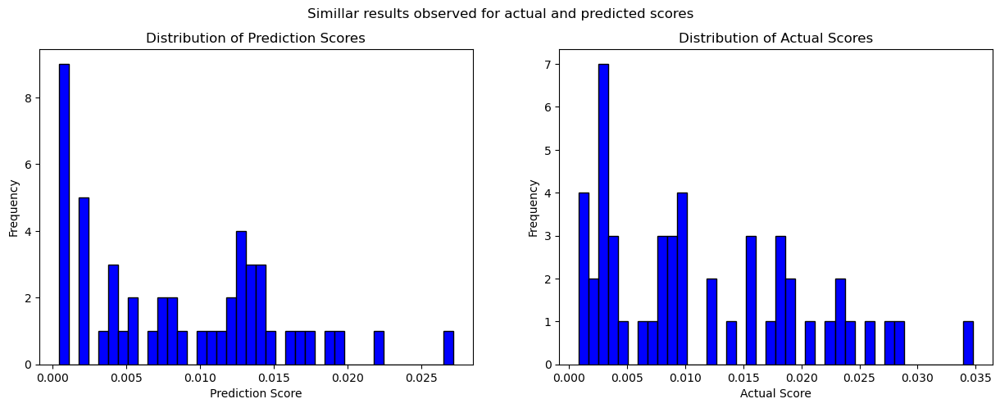

In [120]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))
ax[0].hist(df_frac['PredScore'], bins=40, color='blue', edgecolor='black')
ax[0].set_title('Distribution of Prediction Scores')
ax[0].set_xlabel('Prediction Score')
ax[0].set_ylabel('Frequency')

ax[1].hist(df_frac['ActualScore'], bins=40, color='blue', edgecolor='black')
ax[1].set_title('Distribution of Actual Scores')
ax[1].set_xlabel('Actual Score')
ax[1].set_ylabel('Frequency')

fig.suptitle("Simillar results observed for actual and predicted scores")
plt.show()

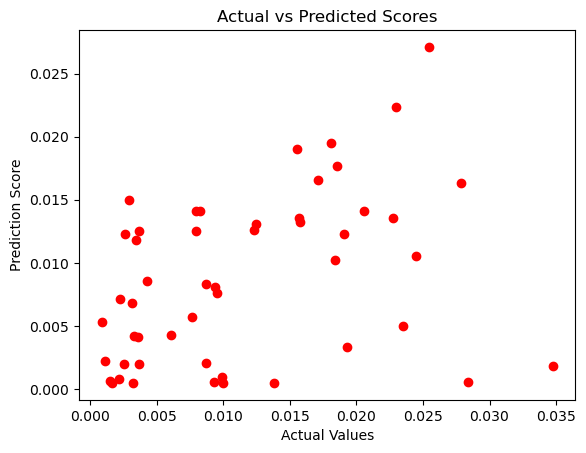

In [121]:
plt.scatter(df_frac['ActualScore'], df_frac['PredScore'], color='red')
plt.title('Actual vs Predicted Scores')
plt.xlabel('Actual Values')
plt.ylabel('Prediction Score')
plt.show()

### Check for other metrices

In [26]:
img='SAGIR'
train_flag = False

# set the directories
test_dir = test_dir_dict[img]
mask_dir_test = test_mask_dir_dict[img]

# initialize the agent , pass the batchSize as the no.of images in the test , state as old to initialize existing model
agent_test_mat = Agent.Agent(train_flag,img_dir=test_dir,msk_dir=mask_dir_test,folder_path=folder_path, state='old',num_epochs=1, batchSize=186, bilinear=False)
agent_test_mat.initializeUnet('UNet_dcJul 02, 2024 02_10PM')

test_loader_mat = agent_test_mat.loadCustomData()

mps
Initialize Custom Data
Augmentation ::: False
Train flag:: False
loader root directory:: /Users/jiten/Masters/WorkPlace/MRI Fractures Project/test_data_SAGIR
Total Size ::: 185


In [27]:
prediction_batch_test_mat, iou_score_batch_test_mat, iou_score_each_test_mat, other_score_each_test_mat = agent_test_mat.runModel(test_loader_mat, otherMetrics=True)
print(len(iou_score_each_test_mat))

0.5672457593906617
Iou Score ::::0.5672457593906617
185


In [ ]:
print(f"Average dice similarity Coefficient :: {other_score_each_test_mat['DSC'].mean()}")
print(f"Average Relative Absolute volumetric difference :: {other_score_each_test_mat['RAVD'].mean()}")
print(f"Average Average Symetric surface distance in mm:: {other_score_each_test_mat['ASSD'].mean()}")
print(f"Average Maximum Surface symetric distance in mm:: {other_score_each_test_mat['MSSD'].mean()}")

Average dice similarity Coefficient :: 0.7193175366092449
Average Relative Absolute volumetric difference :: 0.6708743491228829
Average Average Symetric surface distance in mm:: 10.032308005642246
Average Maximum Surface symetric distance in mm:: 53.59547839809108


In [ ]:
other_score_each_test_mat['MSSD']

53.59547839809108

In [68]:
print(f"Modal dice similarity Coefficient :: {other_score_each_test_mat['DSC'].mode()[0]}")
print(f"Modal Relative Absolute volumetric difference :: {other_score_each_test_mat['RAVD'].mode()[0]}")
print(f"Modal Average Symetric surface distance in mm:: {other_score_each_test_mat['ASSD'].mode()[0]}")
print(f"Modal Maximum Surface symetric distance in mm:: {other_score_each_test_mat['MSSD'].mode()[0]}")

Modal dice similarity Coefficient :: 0.0
Modal Relative Absolute volumetric difference :: 1.0
Modal Average Symetric surface distance in mm:: 0.0
Modal Maximum Surface symetric distance in mm:: 10.0


In [67]:
print(f"Median dice similarity Coefficient :: {other_score_each_test_mat['DSC'].median()}")
print(f"Median Relative Absolute volumetric difference :: {other_score_each_test_mat['RAVD'].median()}")
print(f"Median Average Symetric surface distance in mm:: {other_score_each_test_mat['ASSD'].median()}")
print(f"Median Maximum Surface symetric distance in mm:: {other_score_each_test_mat['MSSD'].median()}")

Median dice similarity Coefficient :: 0.8110310985120335
Median Relative Absolute volumetric difference :: 0.3263993355682734
Median Average Symetric surface distance in mm:: 6.8125319480896
Median Maximum Surface symetric distance in mm:: 35.0


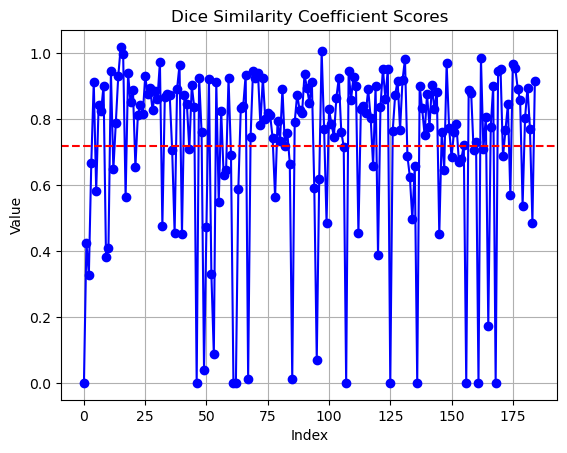

In [41]:
plotResult.valuePlot(other_score_each_test_mat['DSC'], "Dice Similarity Coefficient Scores")

<BarContainer object of 185 artists>

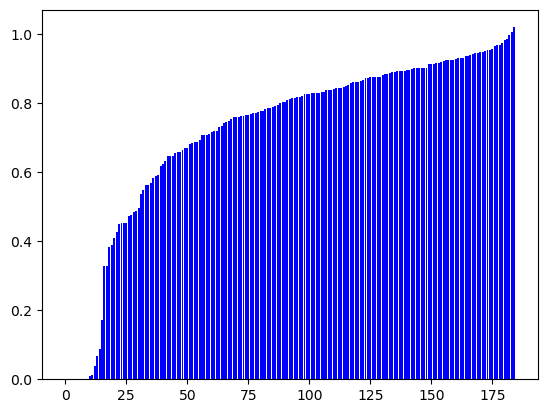

In [51]:
from matplotlib import pyplot as plt
plt.bar(other_score_each_test_mat['DSC'].index, other_score_each_test_mat['DSC'].sort_values(), color='blue')

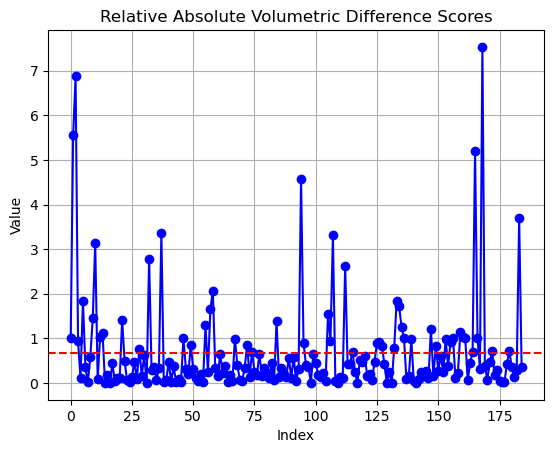

In [42]:
plotResult.valuePlot(other_score_each_test_mat['RAVD'], "Relative Absolute Volumetric Difference Scores")

<BarContainer object of 185 artists>

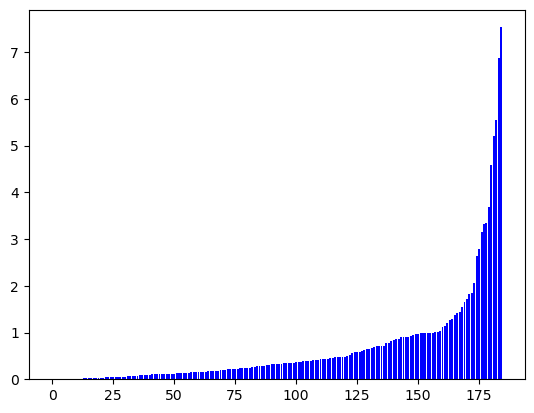

In [50]:
plt.bar(other_score_each_test_mat['RAVD'].index, other_score_each_test_mat['RAVD'].sort_values(), color='blue')

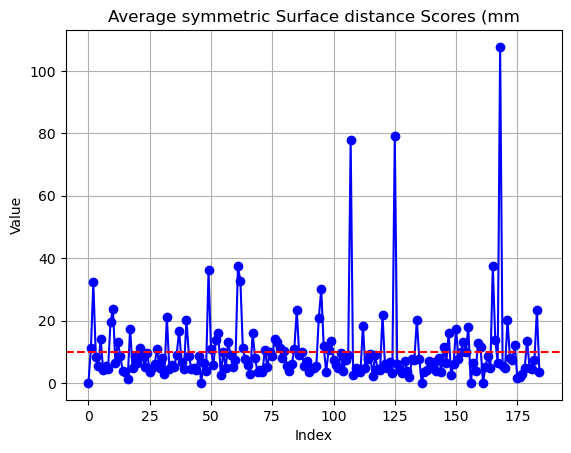

In [44]:
plotResult.valuePlot(other_score_each_test_mat['ASSD'], "Average symmetric Surface distance Scores (mm")

<BarContainer object of 185 artists>

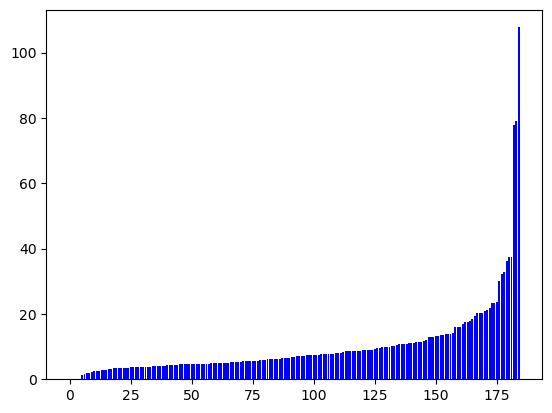

In [49]:
plt.bar(other_score_each_test_mat['ASSD'].index, other_score_each_test_mat['ASSD'].sort_values(), color='blue')

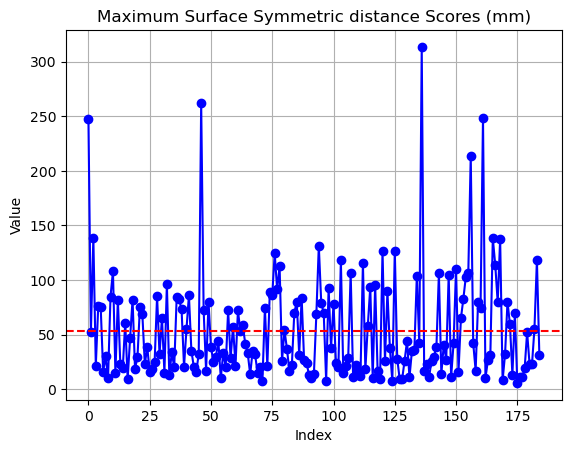

In [46]:
plotResult.valuePlot(other_score_each_test_mat['MSSD'], "Maximum Surface Symmetric distance Scores (mm)")

<BarContainer object of 185 artists>

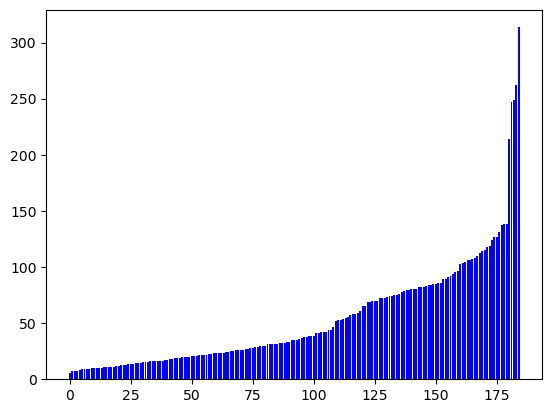

In [48]:
plt.bar(other_score_each_test_mat['MSSD'].index, other_score_each_test_mat['MSSD'].sort_values(), color='blue')